<div style="background-image: url('https://images.unsplash.com/photo-1506905925346-21bda4d32df4?w=1200');
            background-size: cover;
            background-position: center;
            height: 200px;
            border-radius: 15px;
            display: flex;
            align-items: center;
            justify-content: center;
            position: relative;">
    <div style="background: rgba(0,0,0,0.3); 
                padding: 20px; 
                border-radius: 10px; 
                color: white;
                text-align: center;">
        <h1 style="margin: 0;">Exploratory Data Analysis</h1>
    </div>
</div>


## Imports

In [329]:
import matplotlib.pyplot as plt 
import pandas as pd
import holidays
import seaborn as sns
import warnings
import optuna
from sklearn.metrics import mean_absolute_error, r2_score, root_mean_squared_error, mean_squared_error
from sklearn import metrics
import xgboost as xgb
import numpy as np 
import category_encoders as ce
from sklearn.model_selection import TimeSeriesSplit
import missingno as msno 
import shap

warnings.filterwarnings("ignore")


In [330]:
weather = pd.read_csv('../../weather_completed.csv')
weather

,station,time,no2,o3,pm25,wind_speed_10m,wind_direction_10m,temperature_2m,relative_humidity_2m,precipitation,rain,surface_pressure,pressure_msl,shortwave_radiation
0,Belfast Centre,2022-07-17 00:00:00+00:00,14.0,43.0,7.0,5.154415,114.775116,14.488000,86.647680,0.0,0.0,1019.81600,1025.4,0.0
1,Belfast Centre,2022-07-17 01:00:00+00:00,16.0,40.0,7.0,4.680000,112.619910,13.938001,84.056150,0.0,0.0,1019.50710,1025.1,0.0
2,Belfast Centre,2022-07-17 02:00:00+00:00,17.0,39.0,7.0,6.439876,153.435010,14.438001,78.723180,0.0,0.0,1019.61600,1025.2,0.0
3,Belfast Centre,2022-07-17 03:00:00+00:00,17.0,39.0,7.0,7.172949,197.525670,14.888001,77.751450,1.1,1.1,1019.72420,1025.3,0.0
4,Belfast Centre,2022-07-17 04:00:00+00:00,9.0,40.0,7.0,5.623380,140.194470,14.888001,81.976660,1.3,1.3,1019.02790,1024.6,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1289950,York Bootham,2025-07-15 11:00:00+00:00,NaN,38.0,NaN,15.137133,177.273740,16.161001,80.542470,1.1,1.1,1008.41260,1010.2,188.0
1289951,York Bootham,2025-07-15 12:00:00+00:00,NaN,38.0,NaN,18.643690,169.992080,16.811000,76.275190,0.3,0.3,1008.01746,1009.8,137.0
1289952,York Bootham,2025-07-15 13:00:00+00:00,NaN,35.0,NaN,22.528780,172.193700,15.361000,92.257970,1.6,1.6,1008.10810,1009.9,164.0
1289953,York Bootham,2025-07-15 14:00:00+00:00,NaN,35.0,NaN,24.332644,177.031830,15.111000,91.052956,1.0,1.0,1007.70720,1009.5,98.0


In [331]:
def evaluate_model(y_test, y_predicted, remove_log):
    
    assert y_test.size == y_predicted.size, \
        f'Shape mismatched: y_test {y_test.shape}, y_predicted {y_predicted.shape}'
    if remove_log:
        y_predicted = np.expm1(y_predicted)
        
    mae = metrics.mean_absolute_error(y_test, y_predicted)
    mse = metrics.mean_squared_error(y_test, y_predicted)
    r2 = r2_score(y_test, y_predicted)
    RMSE = root_mean_squared_error(y_test, y_predicted)
    print(f'MAE: {mae} \n R2: {r2} \n MSE: {mse} \n RMSE: {RMSE}')

The idea here is that there may be a drop in polution during holidays, for example during christmas there will be less traffic implying there will be a drop in polution, by indicating to the model that a certain day is a holiday may increase the performance. 

In [332]:
uk_holi = holidays.country_holidays('GB', years=[2022, 2023, 2024, 2025])
holiday_dates = set(uk_holi)
weather['is_holiday'] = 0
weather['time'] = pd.to_datetime(weather['time'])
weather['is_holiday'] = weather['time'].dt.date.isin(holiday_dates).astype(int)
holiday_dates


{datetime.date(2022, 1, 1),
 datetime.date(2022, 1, 3),
 datetime.date(2022, 4, 15),
 datetime.date(2022, 5, 2),
 datetime.date(2022, 6, 2),
 datetime.date(2022, 6, 3),
 datetime.date(2022, 9, 19),
 datetime.date(2022, 12, 25),
 datetime.date(2022, 12, 26),
 datetime.date(2022, 12, 27),
 datetime.date(2023, 1, 1),
 datetime.date(2023, 1, 2),
 datetime.date(2023, 4, 7),
 datetime.date(2023, 5, 1),
 datetime.date(2023, 5, 8),
 datetime.date(2023, 5, 29),
 datetime.date(2023, 12, 25),
 datetime.date(2023, 12, 26),
 datetime.date(2024, 1, 1),
 datetime.date(2024, 3, 29),
 datetime.date(2024, 5, 6),
 datetime.date(2024, 5, 27),
 datetime.date(2024, 12, 25),
 datetime.date(2024, 12, 26),
 datetime.date(2025, 1, 1),
 datetime.date(2025, 4, 18),
 datetime.date(2025, 5, 5),
 datetime.date(2025, 5, 26),
 datetime.date(2025, 12, 25),
 datetime.date(2025, 12, 26)}

In [333]:
weather['date'] = pd.to_datetime(weather['time']).dt.date
daily_max = weather.groupby(['station', 'date'])['wind_speed_10m'].max().sort_values(ascending=False).head(5)
daily_max

station                date      
Narberth               2024-12-07    69.465310
Charlton Mackrell      2024-12-07    62.429640
Brighton Preston Park  2023-11-02    62.059025
Blackpool Marton       2023-11-13    61.263493
Brighton Preston Park  2022-11-01    60.753666
Name: wind_speed_10m, dtype: float64

In [334]:
top_5 = daily_max.reset_index()['station'].tolist()
top_5_date = daily_max.reset_index()['date'].tolist()
top_5_date

[datetime.date(2024, 12, 7),
 datetime.date(2024, 12, 7),
 datetime.date(2023, 11, 2),
 datetime.date(2023, 11, 13),
 datetime.date(2022, 11, 1)]

In [335]:
top_5

['Narberth',
 'Charlton Mackrell',
 'Brighton Preston Park',
 'Blackpool Marton',
 'Brighton Preston Park']

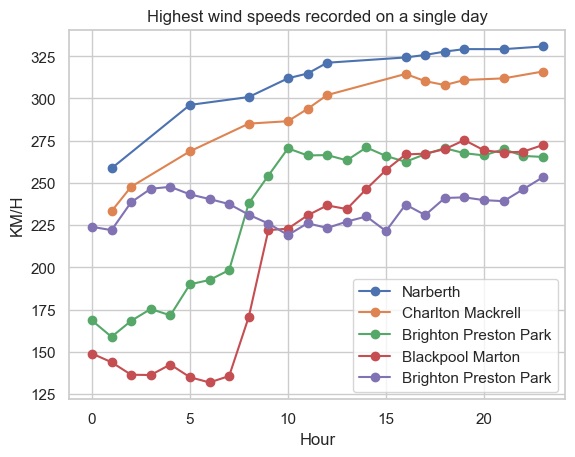

In [336]:
for m, k in enumerate(top_5):
    a = weather[weather['station']==k]
    a = a[a['date']==top_5_date[m]]
    a['hour'] = pd.to_datetime(a['time']).dt.hour
    plt.plot(a['hour'], a['wind_direction_10m'], 'o-',label=k, )
plt.title('Highest wind speeds recorded on a single day')
plt.legend(top_5)
plt.xlabel('Hour')
plt.ylabel('KM/H')
plt.show()
    # plt.scatter()

The temperature seems to reach it's maximum around noon, eventually it plateus. This makes sense because as the sun heats the ground during the morning, the warm air eventually rises to the surface. This causes the air to mix with the faster moving winds, and bringing the faster wind down. 

# Determining which station to remove

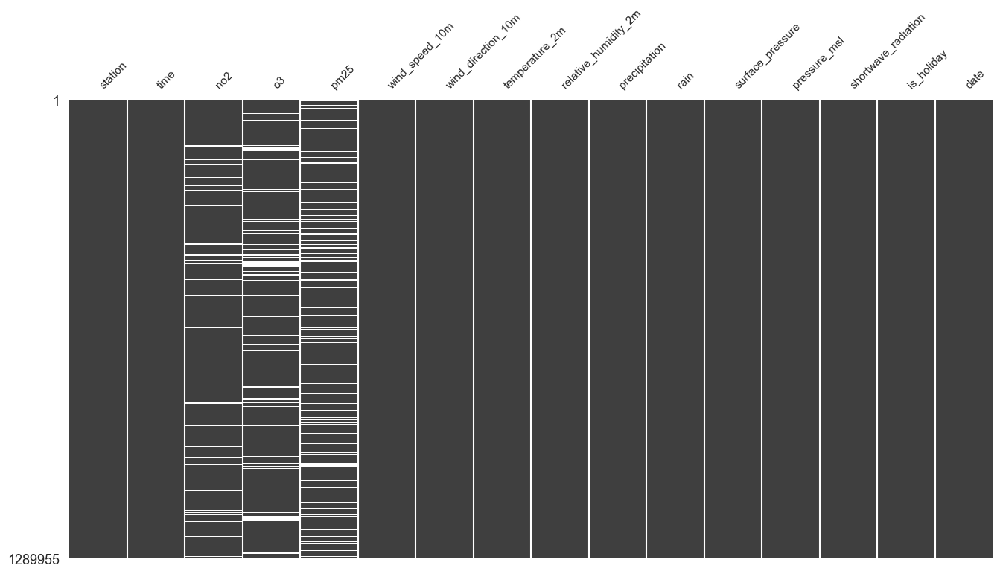

In [337]:
msno.matrix(weather, sparkline=False, figsize=(16,8), fontsize=11, filter='bottom');

By observing the MSNO graph, we can see that the missingness for all 3 pollutants are randomly scattered, this tells us that a lot of the downtimes are random, most likely due to sensor malfunction. We can see that PM2.5 has the most missingness, this could be that the PM2.5 ground sensor is particularly hard to maintain in comparison to o3 and no2 sensor.

In [338]:

averaged_pm = weather.groupby([weather['time'].dt.date, 'station'])['pm25'].mean()
daily_pm25 = averaged_pm.unstack(level='station')
daily_pm25

station,Belfast Centre,Bexley - Belvedere West,Bexley - Slade Green Fidas,Birmingham A4540 Roadside,Blackpool Marton,Bournemouth,Brent - Ikea,Brighton Preston Park,Bristol St Paul's,Camden - Bloomsbury,...,St Osyth,Stoke-on-Trent Centre,Sunderland Silksworth,Waterloo Place (The Crown Estate),Westminster - Queens Park Gardens,Wicken Fen,Wigan Centre,Wirral Tranmere,Yarner Wood,York Bootham
time,,,,,,,,,,,,,,,,,,,,,
2022-07-17,8.000000,7.709091,4.862500,10.375000,7.458333,7.916667,11.380952,7.083333,NaN,4.875000,...,3.857143,10.208333,NaN,5.666667,NaN,3.541667,8.521739,7.916667,NaN,5.956522
2022-07-18,9.791667,10.581818,9.437500,8.750000,8.416667,8.041667,14.590909,9.958333,NaN,8.833333,...,7.428571,7.333333,NaN,8.690476,NaN,5.916667,8.565217,8.333333,5.076923,7.217391
2022-07-19,8.833333,14.100000,11.791667,10.583333,9.958333,11.666667,21.545455,12.125000,NaN,9.833333,...,10.200000,10.208333,NaN,14.038889,NaN,7.833333,10.652174,12.625000,12.750000,10.608696
2022-07-20,5.277778,14.304545,17.225000,14.277778,8.722222,13.166667,17.571429,14.944444,NaN,17.500000,...,15.888889,14.055556,NaN,23.347619,NaN,16.444444,10.941176,10.187500,16.333333,12.882353
2022-07-21,4.166667,6.731818,9.808333,6.750000,3.625000,7.625000,10.590909,11.166667,NaN,9.875000,...,9.125000,6.750000,NaN,10.533333,NaN,9.875000,4.173913,4.708333,4.125000,5.913043
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-07-11,5.826087,5.545833,5.545833,6.043478,5.000000,6.041667,12.416667,4.782609,6.826087,5.004167,...,4.956522,5.521739,3.869565,6.083333,16.333333,3.347826,5.478261,5.913043,3.000000,3.739130
2025-07-12,10.260870,7.775000,5.888889,4.826087,4.695652,5.708333,11.416667,3.047619,6.521739,5.842105,...,5.000000,4.565217,3.521739,9.195455,13.750000,4.695652,4.086957,4.434783,3.000000,4.565217
2025-07-13,5.913043,6.216667,NaN,4.826087,4.391304,5.733333,8.800000,4.312500,6.130435,NaN,...,6.304348,4.347826,6.521739,NaN,14.541667,5.478261,4.173913,4.304348,3.809524,2.782609


# Dropping stations based on downtime

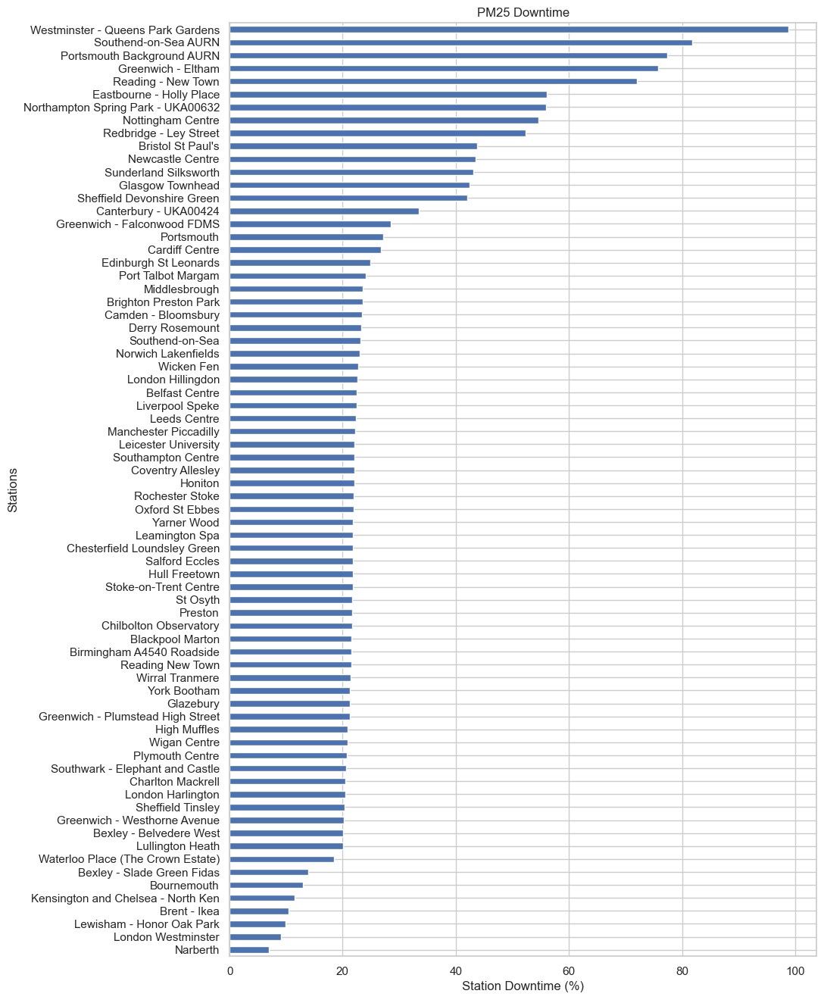

In [339]:
missing_stats = daily_pm25.apply(lambda x: x.isna().sum())
total_cell = len(daily_pm25)
plt.figure(figsize=(10, 16))
percent_miss = (missing_stats/total_cell)*100
percent_miss.sort_values().plot(kind='barh')
plt.xlabel('Station Downtime (%)')
plt.title('PM25 Downtime')
plt.ylabel('Stations')
plt.show()

In [340]:
a = percent_miss[percent_miss > 40].index.tolist()
weather = weather[~weather['station'].isin(a)]
for removed in a:
    print(f'Station: {removed} was removed')

Station: Bristol St Paul's was removed
Station: Eastbourne - Holly Place was removed
Station: Glasgow Townhead was removed
Station: Greenwich - Eltham was removed
Station: Newcastle Centre was removed
Station: Northampton Spring Park - UKA00632 was removed
Station: Nottingham Centre was removed
Station: Portsmouth Background AURN was removed
Station: Reading - New Town was removed
Station: Redbridge - Ley Street was removed
Station: Sheffield Devonshire Green was removed
Station: Southend-on-Sea AURN was removed
Station: Sunderland Silksworth was removed
Station: Westminster - Queens Park Gardens was removed


Here, we can see that the Westminister sensor is down nearly all of the time, it's hard to understand why it was down majority of the time, however one hypothesis is that the sensor may be new, however due to the date range of our data, there is too many missing entries. 
Furthermore, there are about 14 stations which has a lot of missing time. Despite the fact that the model we will be using is XGboost which can handle NaN, the NaNs can still mislead the model, in addition the percentage of missingness doesn't do the station any justice during prediction, therefore we will drop stations with more than 60% missing data.

In [341]:
averaged_o3 = weather.groupby([weather['time'].dt.date, 'station'])['o3'].mean()
daily_o3 = averaged_o3.unstack(level='station')
daily_o3

station,Belfast Centre,Bexley - Belvedere West,Bexley - Slade Green Fidas,Birmingham A4540 Roadside,Blackpool Marton,Bournemouth,Brent - Ikea,Brighton Preston Park,Camden - Bloomsbury,Canterbury - UKA00424,...,Southend-on-Sea,Southwark - Elephant and Castle,St Osyth,Stoke-on-Trent Centre,Waterloo Place (The Crown Estate),Wicken Fen,Wigan Centre,Wirral Tranmere,Yarner Wood,York Bootham
time,,,,,,,,,,,,,,,,,,,,,
2022-07-17,59.291667,78.621053,70.590909,61.083333,67.583333,71.958333,55.909091,69.791667,74.704167,70.833333,...,69.541667,75.493750,64.473684,80.291667,NaN,79.208333,67.478261,72.500000,112.250000,NaN
2022-07-18,83.958333,80.790909,91.336364,67.041667,94.500000,95.750000,55.186364,98.166667,77.112500,88.000000,...,91.416667,86.812500,53.600000,87.875000,NaN,104.666667,88.173913,106.291667,127.791667,NaN
2022-07-19,68.529412,99.125000,93.313636,78.666667,114.583333,116.375000,61.490909,107.833333,72.945833,105.333333,...,105.083333,59.300000,143.733333,110.791667,NaN,115.958333,101.388889,111.250000,134.583333,NaN
2022-07-20,44.454545,80.104545,88.086364,65.777778,63.500000,68.111111,55.733333,63.833333,80.483333,89.833333,...,86.111111,87.913333,101.777778,70.166667,NaN,95.722222,66.000000,64.125000,94.500000,NaN
2022-07-21,43.916667,50.027273,55.063636,32.041667,50.833333,58.291667,30.490909,60.250000,42.745833,57.250000,...,53.625000,48.700000,72.958333,38.000000,NaN,61.041667,48.304348,51.750000,82.750000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-07-11,33.371237,54.395652,57.616667,77.492475,44.288442,58.564284,NaN,46.370252,77.234607,NaN,...,56.719947,NaN,61.545951,61.780485,36.100000,69.761435,43.307043,48.205467,83.702062,66.130435
2025-07-12,44.820808,43.586957,43.878261,69.821166,73.796488,43.587170,NaN,47.923443,57.625000,NaN,...,52.428908,NaN,50.137600,79.803818,45.570833,45.697420,57.937402,75.760987,84.151095,39.391304
2025-07-13,36.833333,63.237500,61.104762,57.510539,37.400000,48.705882,NaN,54.675941,NaN,NaN,...,61.534410,NaN,41.000000,44.000000,66.400000,48.196882,40.666667,49.200000,80.710653,60.739130


Text(0, 0.5, 'Stations')

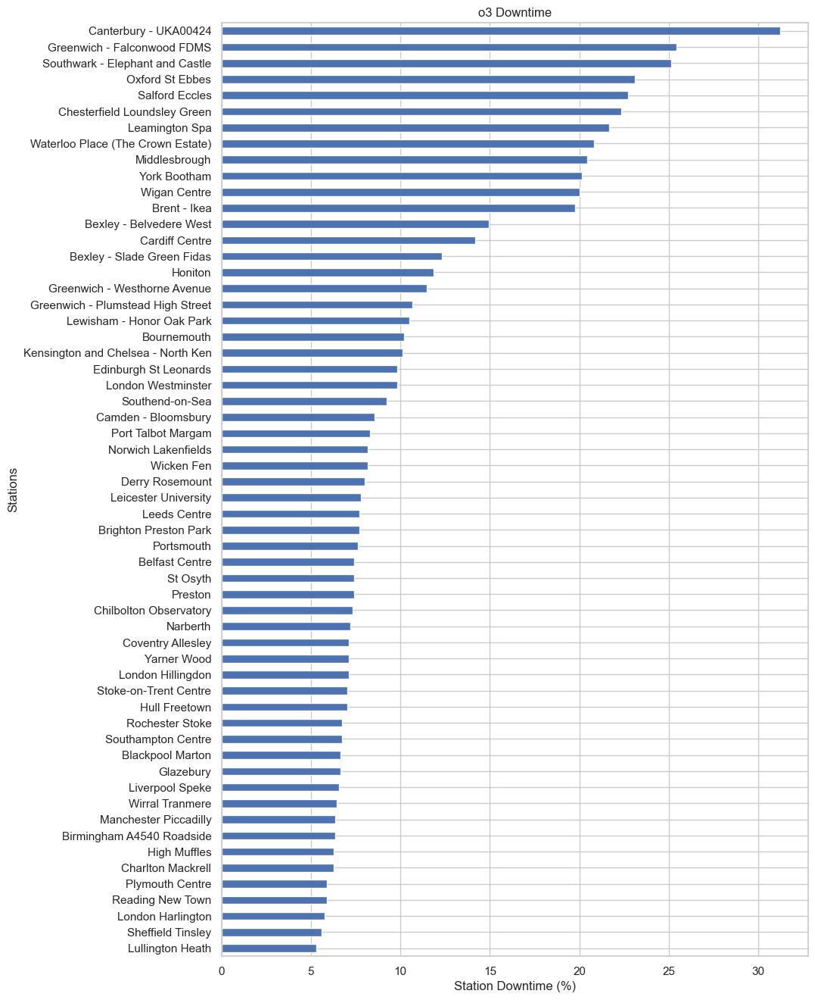

In [342]:
averaged_o3 = weather.groupby([weather['time'].dt.date, 'station'])['no2'].mean()
daily_o3 = averaged_o3.unstack(level='station')

missing_stats = daily_o3.apply(lambda x: x.isna().sum())
total_cell = len(daily_o3)
plt.figure(figsize=(10, 16))
percent_miss = (missing_stats/total_cell)*100
percent_miss.sort_values().plot(kind='barh')
plt.xlabel('Station Downtime (%)')
plt.title('o3 Downtime')
plt.ylabel('Stations')

In [343]:
a = percent_miss[percent_miss > 40].index.tolist()
weather_new = weather[~weather['station'].isin(a)]
for removed in a:
    print(f'Station: {removed} was removed')

Text(0, 0.5, 'Stations')

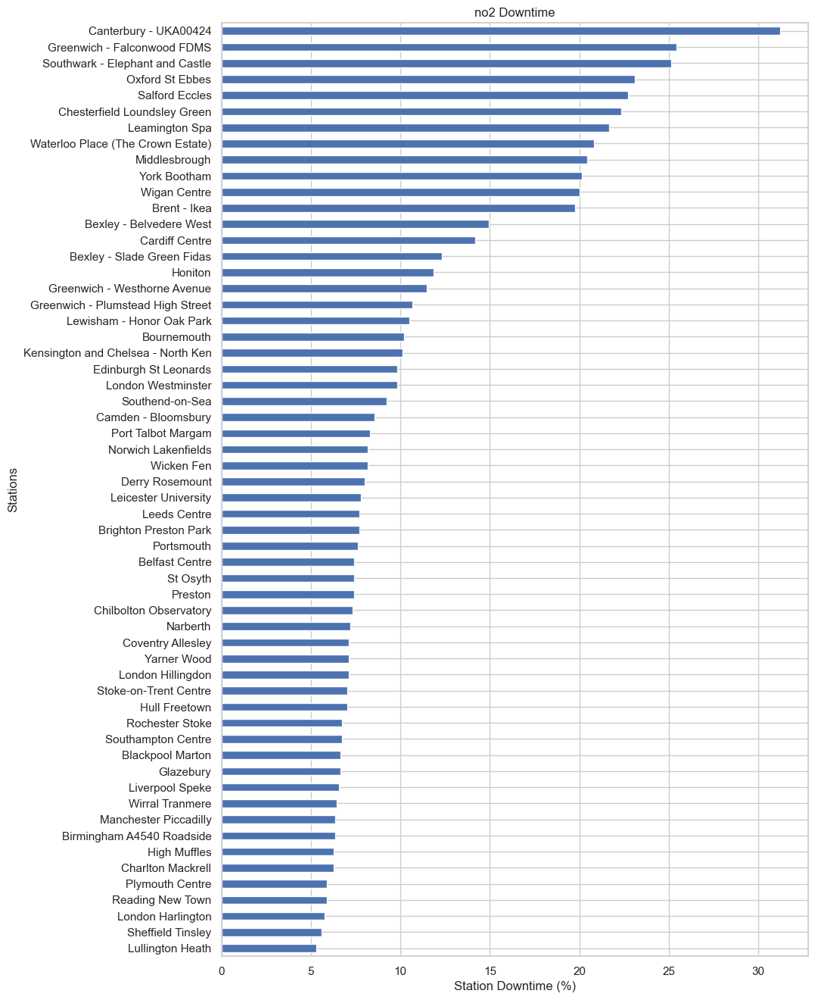

In [344]:
averaged_no2 = weather_new.groupby([weather_new['time'].dt.date, 'station'])['no2'].mean()
daily_no2 = averaged_no2.unstack(level='station')

missing_stats = daily_no2.apply(lambda x: x.isna().sum())
total_cell = len(daily_no2)
plt.figure(figsize=(10, 16))
percent_miss = (missing_stats/total_cell)*100
percent_miss.sort_values().plot(kind='barh')
plt.xlabel('Station Downtime (%)')
plt.title('no2 Downtime')
plt.ylabel('Stations')

It can be seen that when the station is down, all sensors are completely down, therefore no data is recorded. For other stations such as Westminister or Tower hamlets.

Due to this project being a time series prediction project, we will have to remove the stations with the highest amount of downtime.

<Axes: >

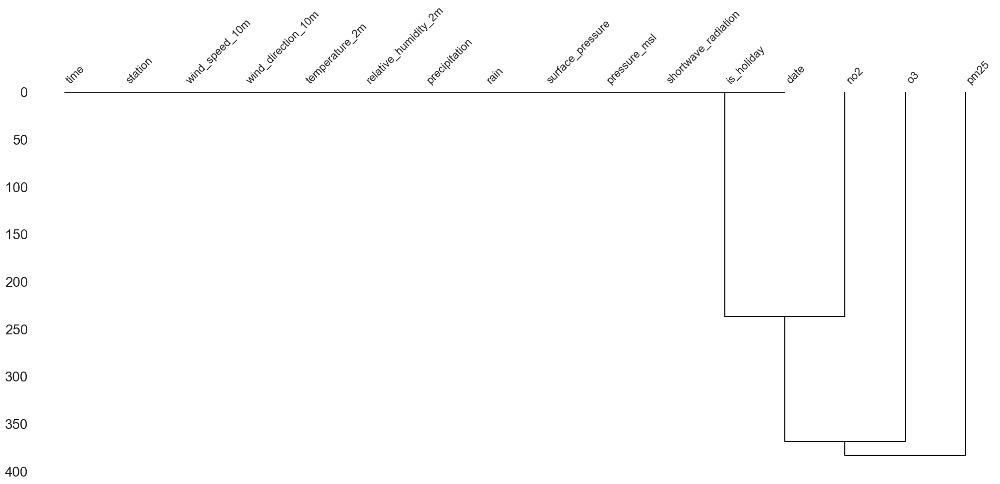

In [345]:
msno.dendrogram(weather)

I decided to set the threshold at 40% because I want to ensure the data is high quality.

We still have 1.2m rows, which is still a lot of data. We haven't lost that much data which is good for us.

In [346]:
averaged_o3 = weather.groupby([weather['time'].dt.date, 'station'])['o3'].mean()
daily_o3 = averaged_o3.unstack(level='station')
daily_o3

station,Belfast Centre,Bexley - Belvedere West,Bexley - Slade Green Fidas,Birmingham A4540 Roadside,Blackpool Marton,Bournemouth,Brent - Ikea,Brighton Preston Park,Camden - Bloomsbury,Canterbury - UKA00424,...,Southend-on-Sea,Southwark - Elephant and Castle,St Osyth,Stoke-on-Trent Centre,Waterloo Place (The Crown Estate),Wicken Fen,Wigan Centre,Wirral Tranmere,Yarner Wood,York Bootham
time,,,,,,,,,,,,,,,,,,,,,
2022-07-17,59.291667,78.621053,70.590909,61.083333,67.583333,71.958333,55.909091,69.791667,74.704167,70.833333,...,69.541667,75.493750,64.473684,80.291667,NaN,79.208333,67.478261,72.500000,112.250000,NaN
2022-07-18,83.958333,80.790909,91.336364,67.041667,94.500000,95.750000,55.186364,98.166667,77.112500,88.000000,...,91.416667,86.812500,53.600000,87.875000,NaN,104.666667,88.173913,106.291667,127.791667,NaN
2022-07-19,68.529412,99.125000,93.313636,78.666667,114.583333,116.375000,61.490909,107.833333,72.945833,105.333333,...,105.083333,59.300000,143.733333,110.791667,NaN,115.958333,101.388889,111.250000,134.583333,NaN
2022-07-20,44.454545,80.104545,88.086364,65.777778,63.500000,68.111111,55.733333,63.833333,80.483333,89.833333,...,86.111111,87.913333,101.777778,70.166667,NaN,95.722222,66.000000,64.125000,94.500000,NaN
2022-07-21,43.916667,50.027273,55.063636,32.041667,50.833333,58.291667,30.490909,60.250000,42.745833,57.250000,...,53.625000,48.700000,72.958333,38.000000,NaN,61.041667,48.304348,51.750000,82.750000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-07-11,33.371237,54.395652,57.616667,77.492475,44.288442,58.564284,NaN,46.370252,77.234607,NaN,...,56.719947,NaN,61.545951,61.780485,36.100000,69.761435,43.307043,48.205467,83.702062,66.130435
2025-07-12,44.820808,43.586957,43.878261,69.821166,73.796488,43.587170,NaN,47.923443,57.625000,NaN,...,52.428908,NaN,50.137600,79.803818,45.570833,45.697420,57.937402,75.760987,84.151095,39.391304
2025-07-13,36.833333,63.237500,61.104762,57.510539,37.400000,48.705882,NaN,54.675941,NaN,NaN,...,61.534410,NaN,41.000000,44.000000,66.400000,48.196882,40.666667,49.200000,80.710653,60.739130


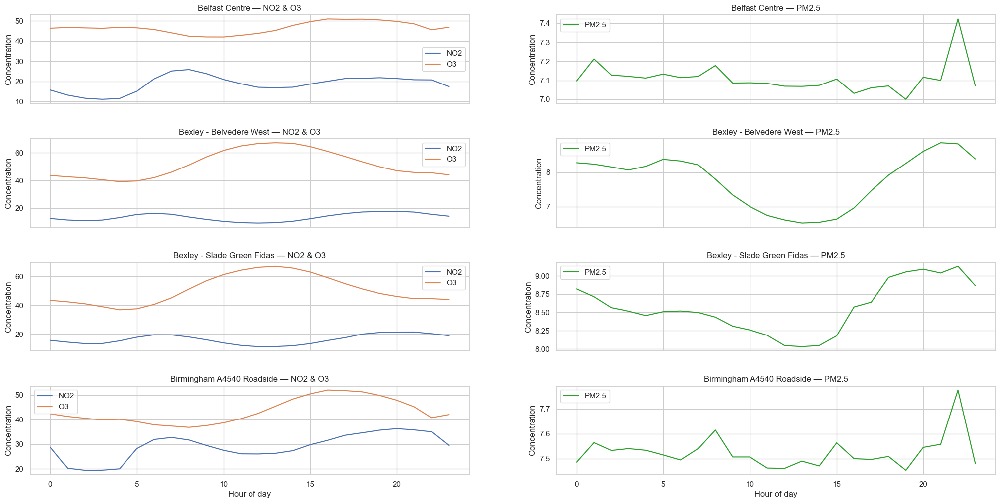

In [347]:
stations = weather_new['station'].unique()[:4]

fig, axs = plt.subplots(len(stations), 2, figsize=(25, 12), sharex=True)
plt.subplots_adjust(hspace=0.4)

for i, station in enumerate(stations):
    weather_station = weather_new[weather_new['station'] == station]
    hourly_means = weather_station.groupby(weather_station['time'].dt.hour)[['no2', 'o3', 'pm25']].mean()

    axs[i, 0].plot(hourly_means.index, hourly_means['no2'], label='NO2')
    axs[i, 0].plot(hourly_means.index, hourly_means['o3'], label='O3')
    axs[i, 0].set_title(f"{station} — NO2 & O3")
    axs[i, 0].set_ylabel("Concentration")
    axs[i, 0].legend()


    axs[i, 1].plot(hourly_means.index, hourly_means['pm25'], label='PM2.5', color='tab:green')
    axs[i, 1].set_title(f"{station} — PM2.5")
    axs[i, 1].set_ylabel("Concentration")
    axs[i, 1].legend()

for ax in axs[-1, :]:  
    ax.set_xlabel("Hour of day")


We can see for all of the stations, the PM2.5 peaks late at night, this is due to the phenomenon called temperature inversion and reduces wind speed. As the ground cools overnight, it can trap pollutants near the surface and due to the low wind speed it prevents the pollutans from escaping. 

In terms of o3, we can see that o3 is the lowest early in the morning and peaks around afternoon, this is normal behaviour. 


# Analysing the Metorlogical data for Stations with Highest Pollutant 

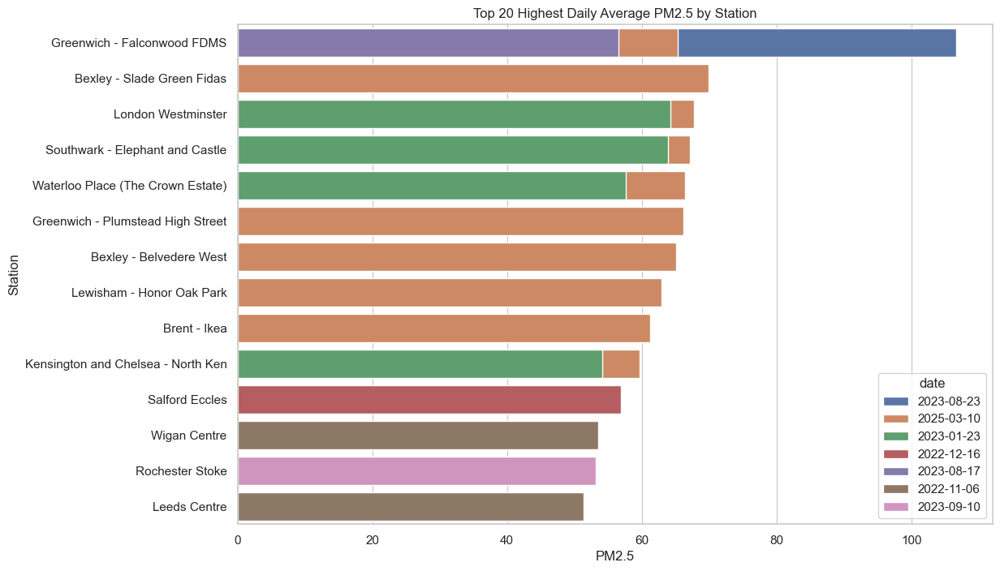

In [348]:
rolling_df = (
    weather_new
    .sort_values(['station', 'date'])
    .groupby(['station', 'date'])['pm25']
    .mean()
    .dropna()
).reset_index()
sorted_df = rolling_df.sort_values(by='pm25', ascending=False)
top_5_highest= sorted_df.iloc[:20]

plt.figure(figsize=(12,8))
sns.barplot(
    data=top_5_highest,
    x='pm25',
    y='station',
    hue='date',  
    dodge=False
)
plt.xticks(rotation=0)
plt.title("Top 20 Highest Daily Average PM2.5 by Station")
plt.ylabel("Station")
plt.xlabel("PM2.5")
plt.show()


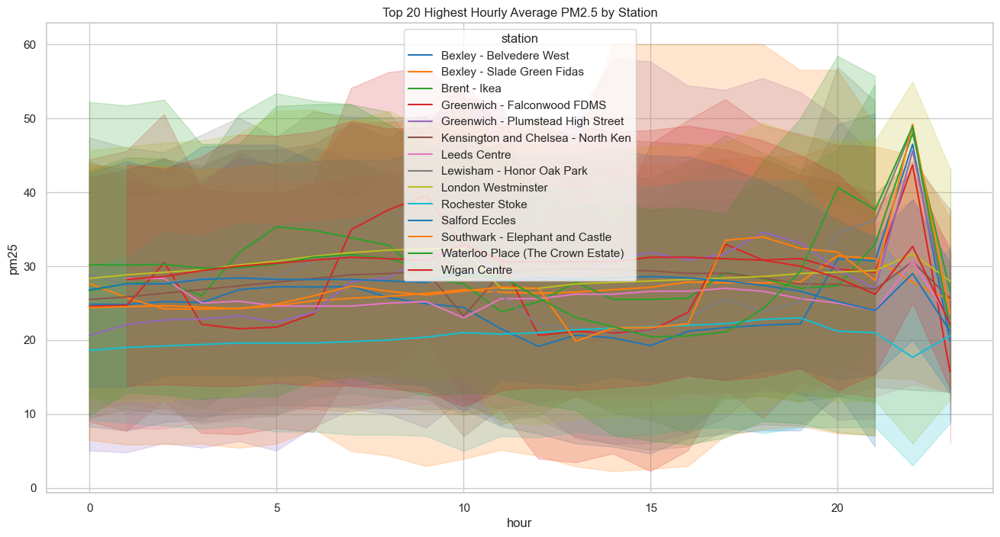

In [349]:

plt.figure(figsize=(16,8))
locked = top_5_highest[['station', 'date']]
weather_new['hour'] = weather_new['time'].dt.hour
locked = weather_new[weather_new['station'].isin(locked['station'])&
            weather_new['date'].isin(locked['date'])]
locked['pm25'] = locked['pm25'].clip(upper=60)
sns.set_theme(style="whitegrid")
sns.lineplot(locked, x='hour', y='pm25', hue='station', palette="tab10", markers=True)
plt.title("Top 20 Highest Hourly Average PM2.5 by Station")
plt.show()

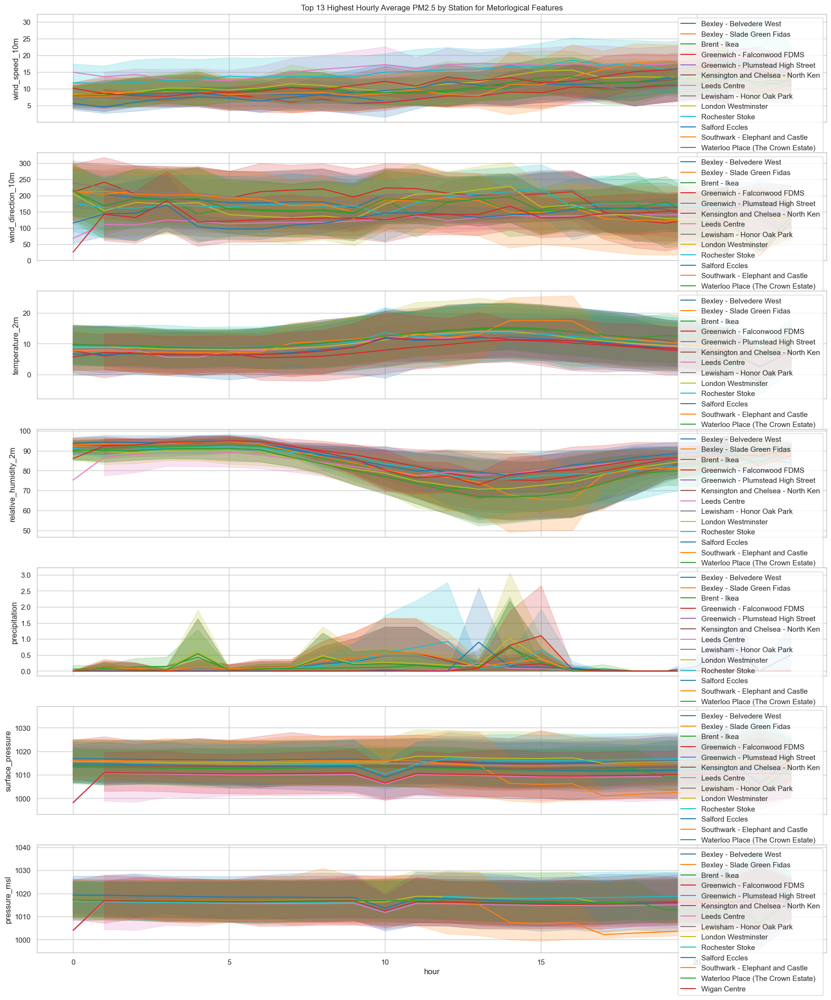

In [350]:
features = ['wind_speed_10m', 'wind_direction_10m', 'temperature_2m', 'relative_humidity_2m', 'precipitation', 'surface_pressure', 'pressure_msl']
f, axes = plt.subplots(len(features), 1, figsize=(18, 3*len(features)), sharex=True)
f.tight_layout(pad=3.0)

for k, feature in enumerate(features):
    sns.lineplot(locked, x='hour', y=f'{feature}', hue='station', palette="tab10", markers=True, ax=axes[k])
    axes[k].legend(loc='upper right')
    
axes[0].set_title("Top 13 Highest Hourly Average PM2.5 by Station for Metorlogical Features")
plt.show()

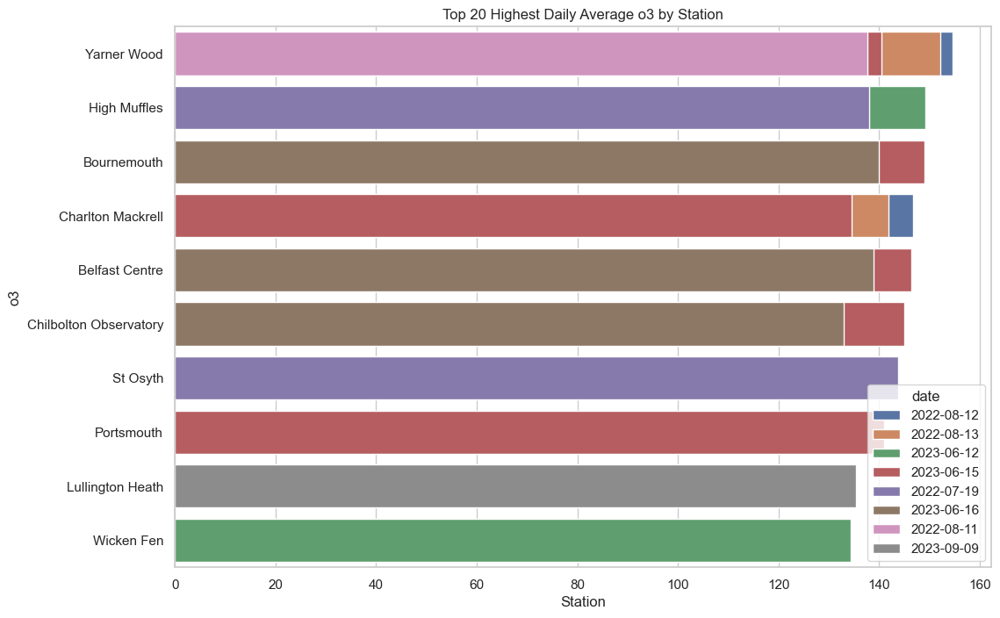

In [351]:
rolling_df = (
    weather_new
    .sort_values(['station', 'date'])
    .groupby(['station', 'date'])['o3']
    .mean()
    .dropna()
).reset_index()
sorted_df = rolling_df.sort_values(by='o3', ascending=False)
top_5_highest = sorted_df.iloc[:20]

plt.figure(figsize=(12,8))
sns.barplot(
    data=top_5_highest,
    x='o3',
    y='station',
    hue='date',  
    dodge=False
)
plt.xticks(rotation=0)
plt.title("Top 20 Highest Daily Average o3 by Station")
plt.ylabel("o3")
plt.xlabel("Station")
plt.show()


Text(0.5, 1.0, 'Top 20 Highest Hourly Average o3 by Station')

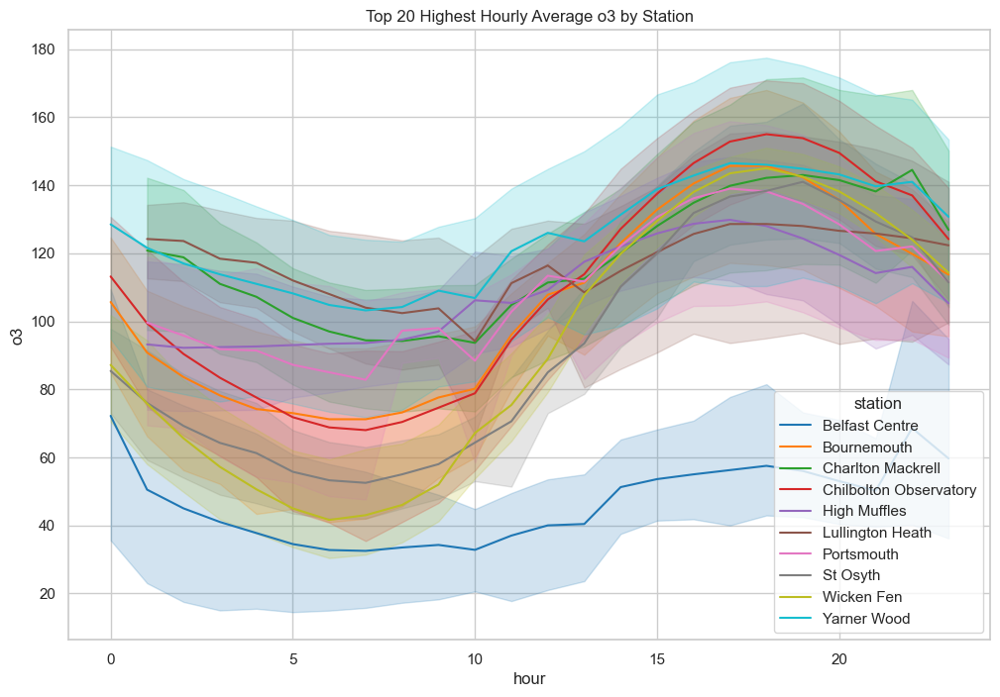

In [352]:
plt.figure(figsize=(12,8))
o3_highest = top_5_highest[['station', 'date']]
weather_new['hour'] = weather_new['time'].dt.hour
o3_highest = weather_new[weather_new['station'].isin(o3_highest['station'])&
            weather_new['date'].isin(o3_highest['date'])]
sns.set_theme(style="whitegrid")
sns.lineplot(o3_highest, x='hour', y='o3', hue='station', palette="tab10", markers=True)
plt.title("Top 20 Highest Hourly Average o3 by Station")

From observing the plot above, we can see that the o3 pollution starts to from at 12AM and reaches it's lowest around 5:30 AM during peak days, then it reaches it's maximum around 8PM. The magnitude of the peaks are 150+, this tells us that it's a very severe ozone episode, most likely a very hot and sunny day or stagnant weather conditions. 
Furthermore, some stations stay very hot overnight this indicate regional transport of ozone or local sources.


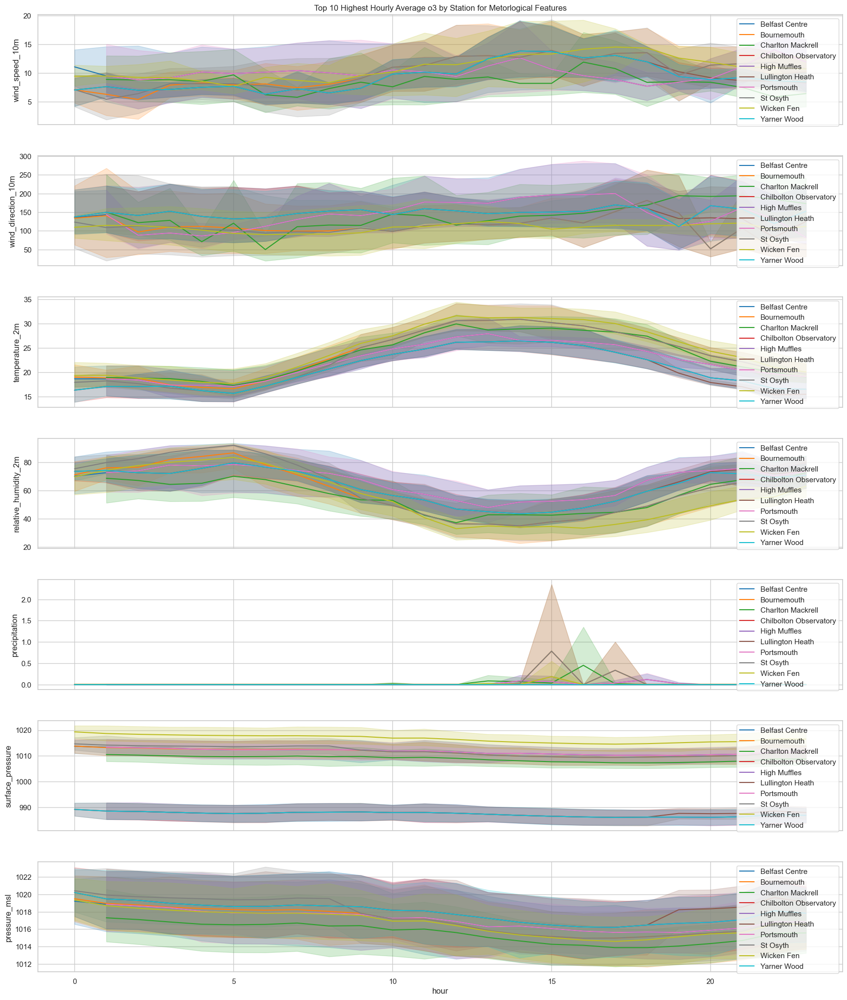

In [353]:
features = ['wind_speed_10m', 'wind_direction_10m', 'temperature_2m', 'relative_humidity_2m', 'precipitation', 'surface_pressure', 'pressure_msl']
f, axes = plt.subplots(len(features), 1, figsize=(18, 3*len(features)), sharex=True)
f.tight_layout(pad=3.0)

for k, feature in enumerate(features):
    sns.lineplot(o3_highest, x='hour', y=f'{feature}', hue='station', palette="tab10", markers=True, ax=axes[k])
    axes[k].legend(loc='upper right')
axes[0].set_title("Top 10 Highest Hourly Average o3 by Station for Metorlogical Features")
plt.show()

The temperature here peaks around 30-32°C in mid-afternoon, which aligns with the ozone peaks, with high temperatures accelerating photochemical ozone formation. 

We can also see an inverse relationship with temperature and humidity, where humidity is high overnight and drops during the peaks. Lower humidity during the day favours ozone formation.

In terms of the wind speed, it's generally low throughout the day, this is typical for high ozone days.

For the pressure, we can see that it's relatively stable and high, which suggests high pressure systems which are associated with clear skies and light wind and stagnant conditions. 


<Axes: >

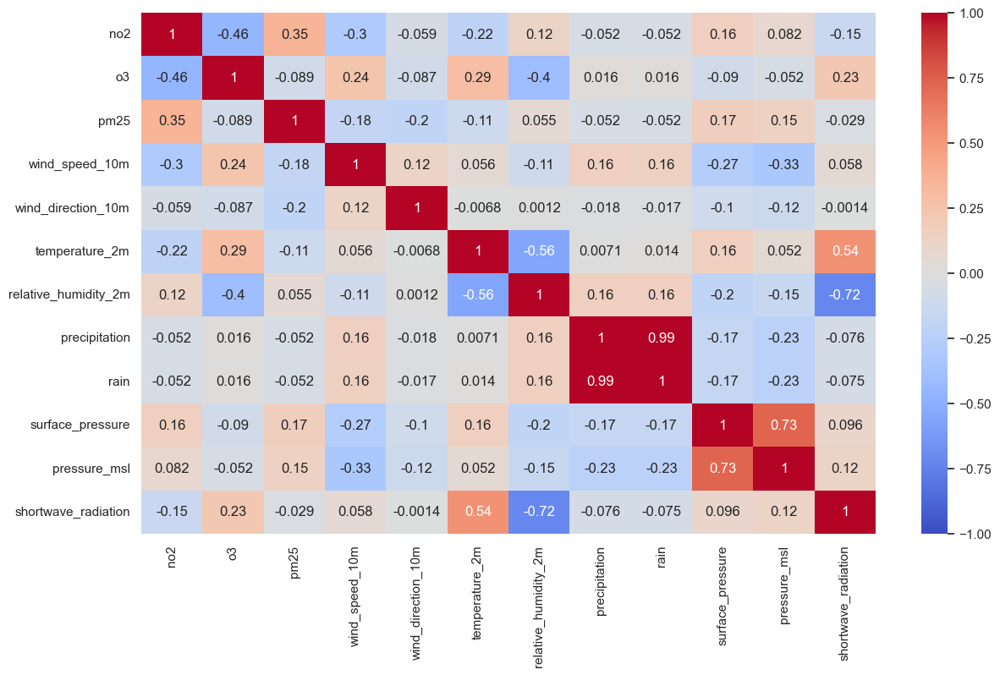

In [354]:
features = ['no2',
 'o3',
 'pm25',
 'wind_speed_10m',
 'wind_direction_10m',
 'temperature_2m',
 'relative_humidity_2m',
 'precipitation',
 'rain',
 'surface_pressure',
 'pressure_msl',
 'shortwave_radiation']
plt.figure(figsize=(14,8))
corr = weather_new[features].corr() 
sns.heatmap(corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1)

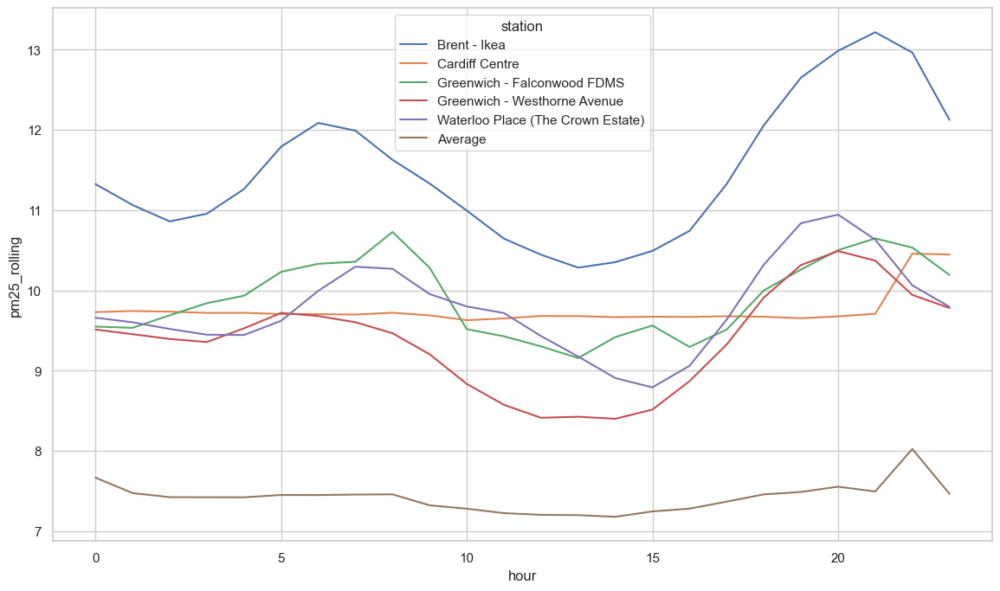

In [355]:
averaged_stations = (weather_new.groupby(['station'])['pm25']
.mean()
.reset_index())
top_5_stations = averaged_stations.sort_values(ascending=False, by='pm25')[:5]
# top_5_stations
top_polluters = weather_new[weather_new['station'].isin(top_5_stations['station'])]
top_polluters = top_polluters.sort_values(['station', 'time'])
top_polluters.index = top_polluters['time']
top_polluters = (top_polluters
                 .groupby(['station', 'hour'])['pm25']
                 .mean()
                 .reset_index()
                 )

# top_polluters = top_polluters.dropna(subset='pm25_rolling')
top_polluters['pm25_rolling'] = (top_polluters.groupby(['station'])['pm25']
        .transform(lambda x: x.rolling(window = 2, min_periods=1).mean())
        )

all_polluters = (weather_new.
                 groupby(['hour'])['pm25']
                 .mean()
                 .reset_index())
all_polluters['station'] = 'Average'
all_polluters['pm25_rolling'] = all_polluters['pm25']
pollut = pd.concat([top_polluters , all_polluters])
plt.figure(figsize=(14, 8))
sns.lineplot(pollut, x='hour', y='pm25_rolling', hue='station')
plt.show()

It seems like Brent - Ikea has a lot higher average PM2.5 than any other stations, in the UK, meanwhile the others sit around 7-10 µg/m³. This is most probably because the Ikea is next to the North Circular and the ikea itself pulls in a lot of cars and vans.

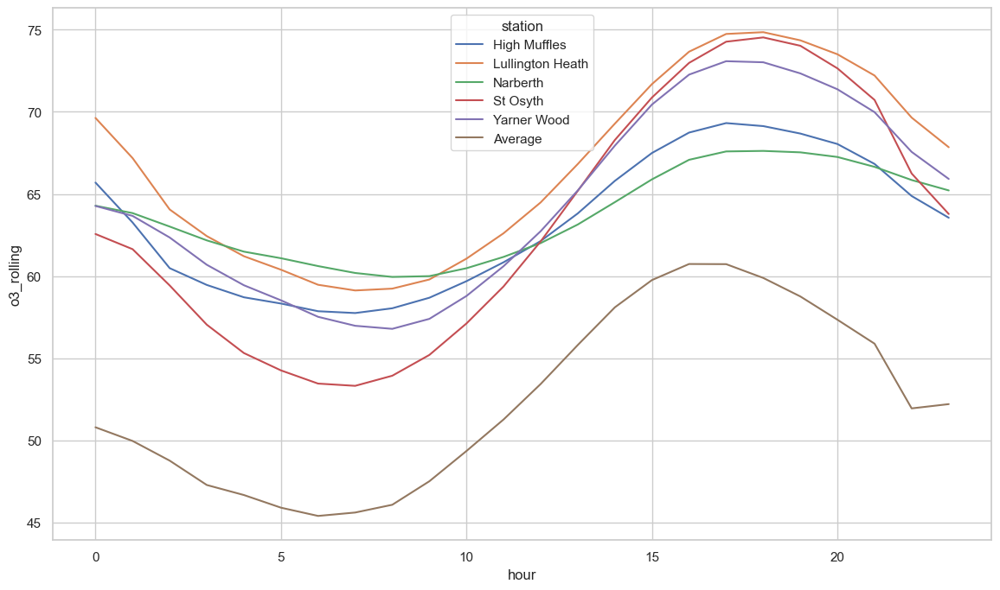

In [356]:
averaged_stations = (weather_new.groupby(['station'])['o3']
.mean()
.reset_index())
top_5_stations = averaged_stations.sort_values(ascending=False, by='o3')[:5]
# top_5_stations
top_polluters = weather_new[weather_new['station'].isin(top_5_stations['station'])]
top_polluters = top_polluters.sort_values(['station', 'time'])
top_polluters.index = top_polluters['time']
top_polluters = (top_polluters
                 .groupby(['station', 'hour'])['o3']
                 .mean()
                 .reset_index()
                 )

# top_polluters = top_polluters.dropna(subset='pm25_rolling')
top_polluters['o3_rolling'] = (top_polluters.groupby(['station'])['o3']
        .transform(lambda x: x.rolling(window = 2, min_periods=1).mean())
        )

all_polluters = (weather_new.
                 groupby(['hour'])['o3']
                 .mean()
                 .reset_index())
all_polluters['station'] = 'Average'
all_polluters['o3_rolling'] = all_polluters['o3']
pollut = pd.concat([top_polluters , all_polluters])
plt.figure(figsize=(14, 8))
sns.lineplot(pollut, x='hour', y='o3_rolling', hue='station')
plt.show()

By checking the stations, we can see that all of the stations are coastal.



<div style="background-image: url('https://external-preview.redd.it/4DD9toe34_3xPVCyEQVTcFuZKCnp5mNEfNeW98kWuG4.jpg?auto=webp&s=f27432834afe60efc99b28ed8f9dccecd2efecef');
            background-size: cover;
            background-position: center;
            height: 200px;
            border-radius: 15px;
            display: flex;
            align-items: center;
            justify-content: center;
            position: relative;">
    <div style="background: rgba(0,0,0,0.3); 
                padding: 20px; 
                border-radius: 10px; 
                color: white;
                text-align: center;">
        <h1 style="margin: 0;">1. Observing temporal data by Day of Week </h1>
    </div>
</div>


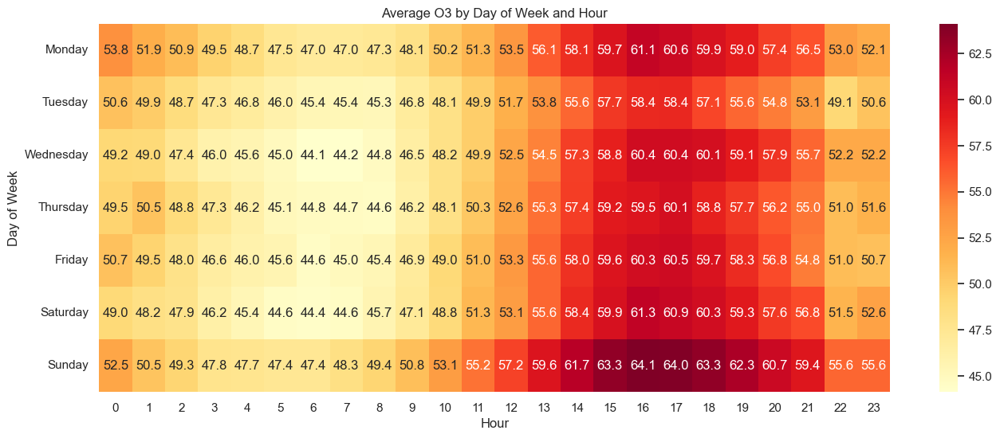

In [357]:
weather_new_copy = weather_new
weather_new_copy['day_of_week'] = weather_new_copy['time'].dt.day_name()
weather_new_copy['hour'] = weather_new_copy['time'].dt.hour
heat = weather_new_copy.pivot_table(
    index='day_of_week',
    columns='hour',
    values='o3',
    aggfunc='mean'
)
heat = heat.reindex(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

plt.figure(figsize=(16,6))
sns.heatmap(heat, cmap='YlOrRd', annot=True, fmt=".1f")
plt.xlabel('Hour')
plt.ylabel('Day of Week')
plt.title('Average O3 by Day of Week and Hour')
plt.show()

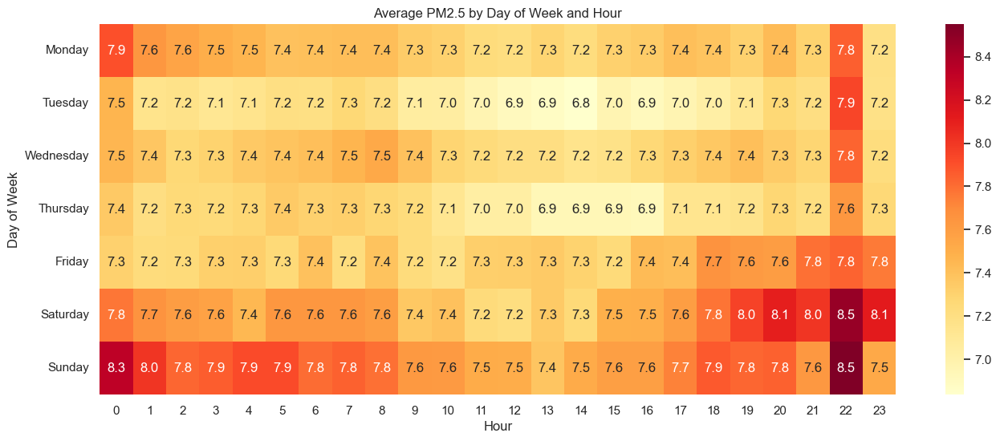

In [358]:
heat = weather_new.pivot_table(
    index='day_of_week',
    columns='hour',
    values='pm25',
    aggfunc='mean'
)
heat = heat.reindex(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

plt.figure(figsize=(16,6))
sns.heatmap(heat, cmap='YlOrRd', annot=True, fmt=".1f")
plt.xlabel('Hour')
plt.ylabel('Day of Week')
plt.title('Average PM2.5 by Day of Week and Hour')
plt.show()

# Do features affect polutants?

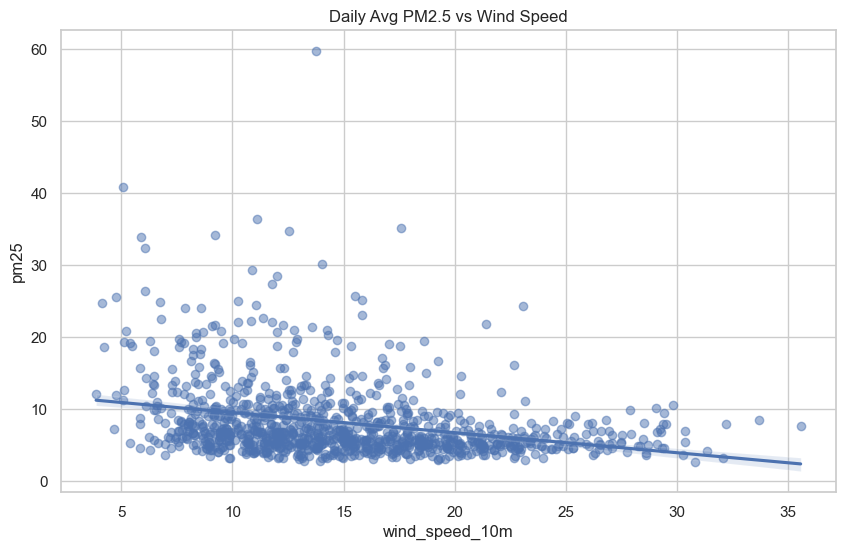

In [359]:
wind = weather_new.groupby(weather_new['time'].dt.date).agg(
    {
        'pm25': 'mean',
        'wind_speed_10m': 'mean'
    }
).reset_index()
plt.figure(figsize=(10,6))
sns.regplot(wind, y = 'pm25', x = 'wind_speed_10m', scatter_kws={"alpha":0.5})
plt.title("Daily Avg PM2.5 vs Wind Speed")
plt.show()

We can see that there is a downward trend, as the wind speed increases, the pm25 becomes scattered therefore making the station recordings lower.

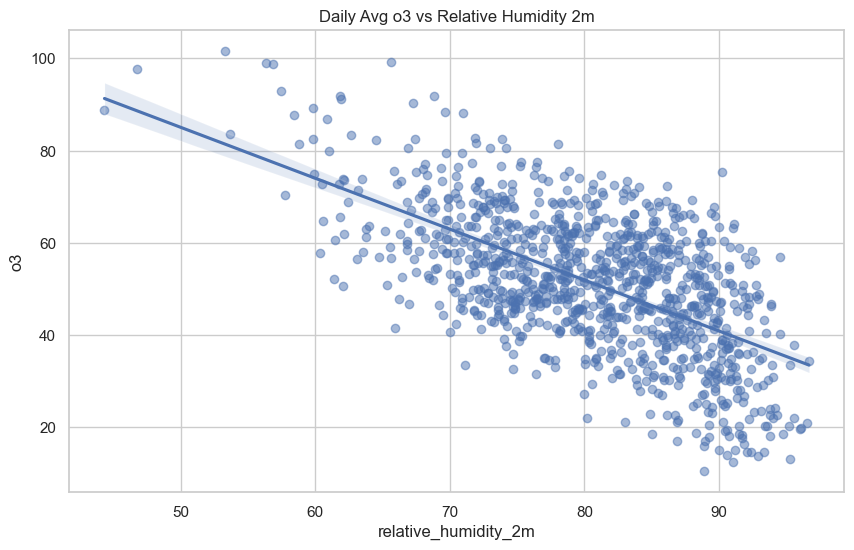

In [360]:
wind = weather_new.groupby(weather_new['time'].dt.date).agg(
    {
        'o3': 'mean',
        'relative_humidity_2m': 'mean'
    }
).reset_index()
plt.figure(figsize=(10,6))
sns.regplot(wind, y = 'o3', x = 'relative_humidity_2m', scatter_kws={"alpha":0.5})
plt.title("Daily Avg o3 vs Relative Humidity 2m")
plt.show()

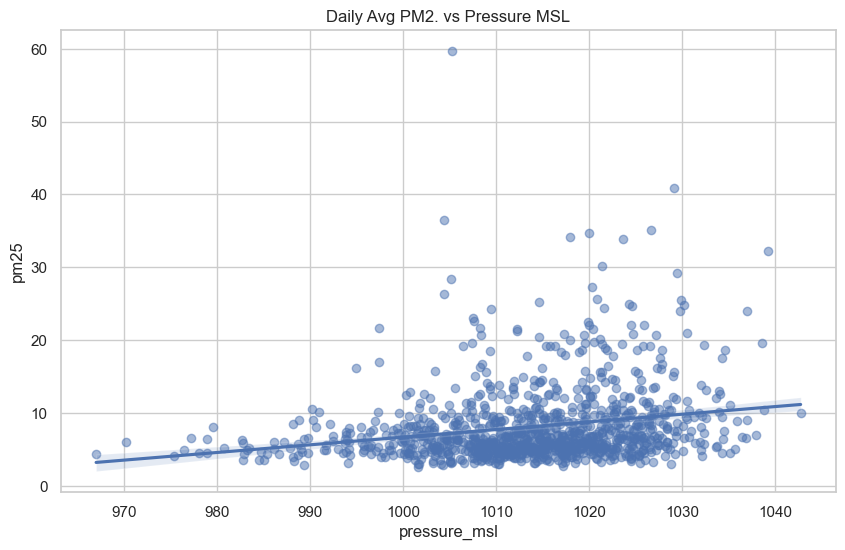

The correlation is: 
 [[1.         0.22226279]
 [0.22226279 1.        ]]


In [361]:
wind = weather_new.groupby(weather_new['time'].dt.date).agg(
    {
        'pm25': 'mean',
        'pressure_msl': 'mean'
    }
).reset_index()
plt.figure(figsize=(10,6))
sns.regplot(wind, y = 'pm25', x = 'pressure_msl', scatter_kws={"alpha":0.5})
plt.title("Daily Avg PM2. vs Pressure MSL")
plt.show()

correlation = np.corrcoef(wind['pm25'], wind['pressure_msl'])
print('The correlation is: \n {}'.format(correlation))

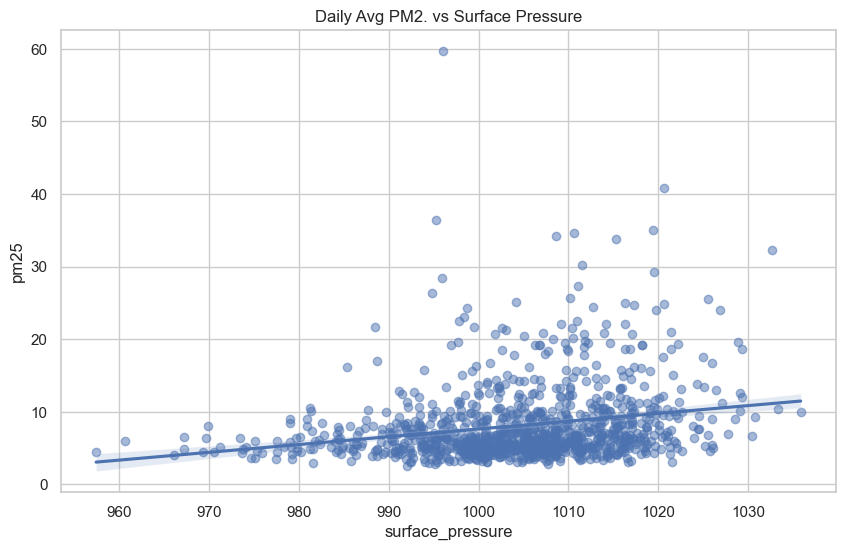

The correlation is: 
 [[1.         0.22918685]
 [0.22918685 1.        ]]


In [362]:
wind = weather_new.groupby(weather_new['time'].dt.date).agg(
    {
        'pm25': 'mean',
        'surface_pressure': 'mean'
    }
).reset_index()
plt.figure(figsize=(10,6))
sns.regplot(wind, y = 'pm25', x = 'surface_pressure', scatter_kws={"alpha":0.5})
plt.title("Daily Avg PM2. vs Surface Pressure")
plt.show()
correlation = np.corrcoef(wind['pm25'], wind['surface_pressure'])
print('The correlation is: \n {}'.format(correlation))

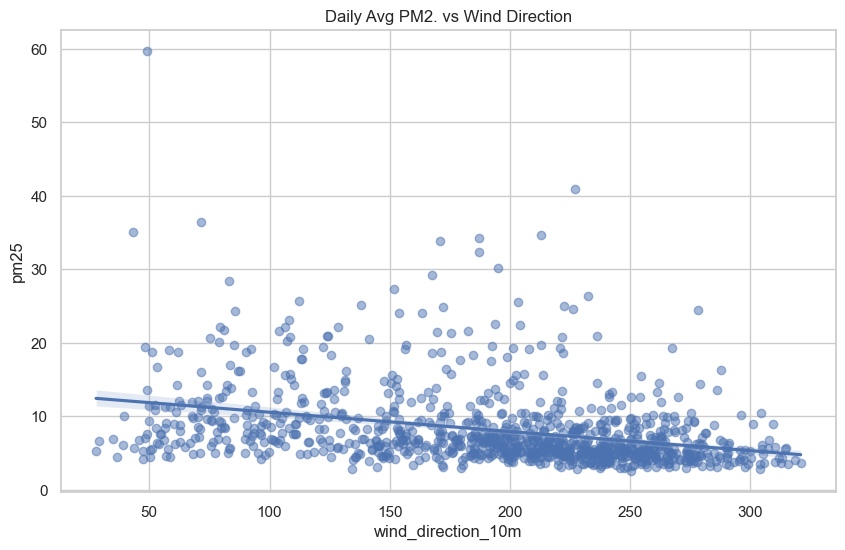

The correlation is: 
 [[ 1.         -0.32989705]
 [-0.32989705  1.        ]]


In [363]:
wind = weather_new.groupby(weather_new['time'].dt.date).agg(
    {
        'pm25': 'mean',
        'wind_direction_10m': 'mean'
    }
).reset_index()
plt.figure(figsize=(10,6))
sns.regplot(wind, y = 'pm25', x = 'wind_direction_10m', scatter_kws={"alpha":0.5})
plt.title("Daily Avg PM2. vs Wind Direction")
plt.show()
correlation = np.corrcoef(wind['pm25'], wind['wind_direction_10m'])
print('The correlation is: \n {}'.format(correlation))

There seems to be a slight correlation between Pressure MSL and PM2.5, however it's quite low especially at 0.22. This is the same case with Surface pressure and PM2.5

## Does particulate matte 2.5 spike during holidays?

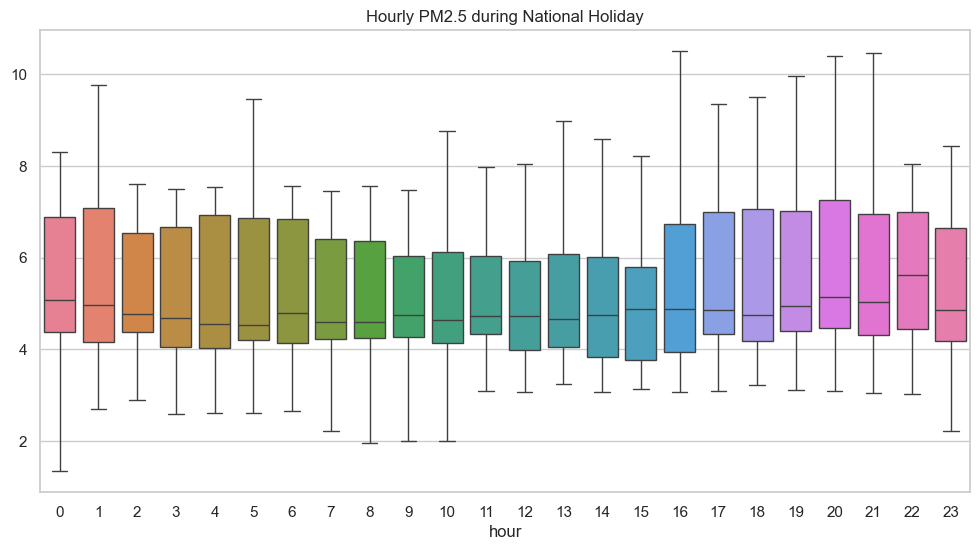

In [364]:
heat = weather_new[weather_new['is_holiday'] == 1].pivot_table(
    index='date',
    columns='hour',
    values='pm25'
)
plt.figure(figsize=(12,6))
sns.boxplot(data=heat, showfliers=False)
plt.title('Hourly PM2.5 during National Holiday')
plt.show()


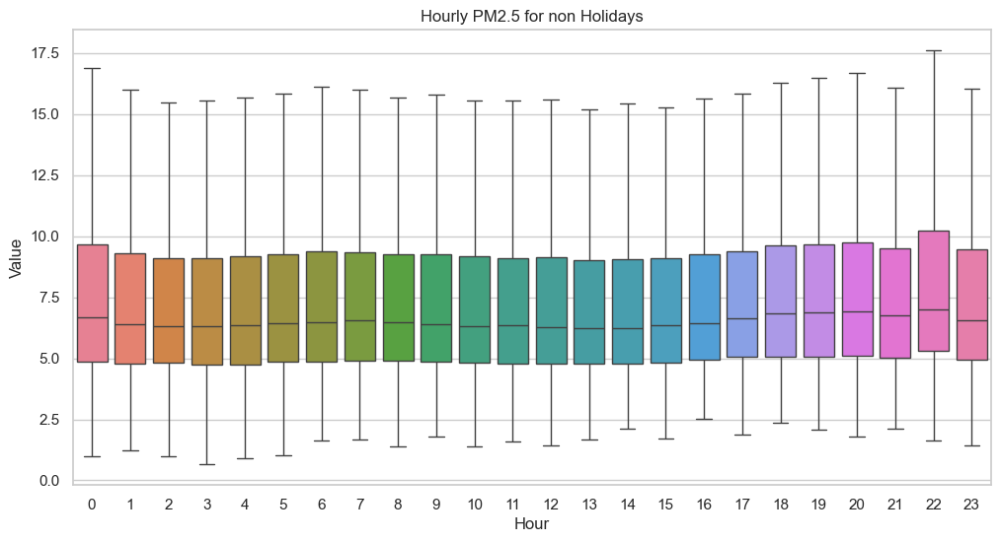

In [365]:
heat = weather_new[weather_new['is_holiday'] != 1].pivot_table(
    index='date',
    columns='hour',
    values='pm25'
)
plt.figure(figsize=(12,6))
sns.boxplot(data=heat, showfliers=False)
plt.title('Hourly PM2.5 for non Holidays')
plt.xlabel('Hour')
plt.ylabel('Value')
plt.show()

Yes, it can be seen that there is a clear spike shown in the boxplots, the medians are above 6 in contrast to holiday seaons. The 3rd pentile ranges are also higher. When we're talking about holidays, this means national holidays i.e Christmas. However it may be a bit skewed because majority of the holidays are bank holidays however there will be a drop in the usage of cars.

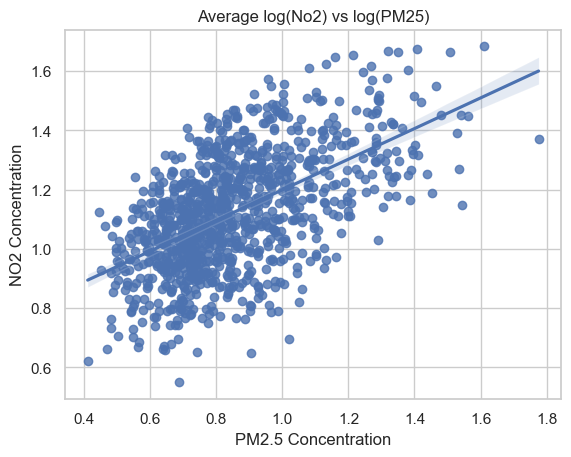

In [366]:
wind = weather_new.groupby(weather_new['time'].dt.date).agg(
    {
        'no2': 'mean',
        'pm25': 'mean'
    }
).reset_index()

wind['log_pm25'] = np.log10(wind['pm25'])
wind['log_no2'] = np.log10(wind['no2'])
ax = sns.regplot(wind, x='log_pm25', y='log_no2')
plt.title('Average log(No2) vs log(PM25)')
ax.set_xlabel('PM2.5 Concentration')
ax.set_ylabel('NO2 Concentration')
plt.show()

## Weekend vs Weekday - Is there a difference?

In [367]:
weather_new_copy = weather_new
weather_new_copy.index = weather_new_copy['time']
weather_new_copy['is_weekend'] = weather_new_copy.index.day_of_week > 4

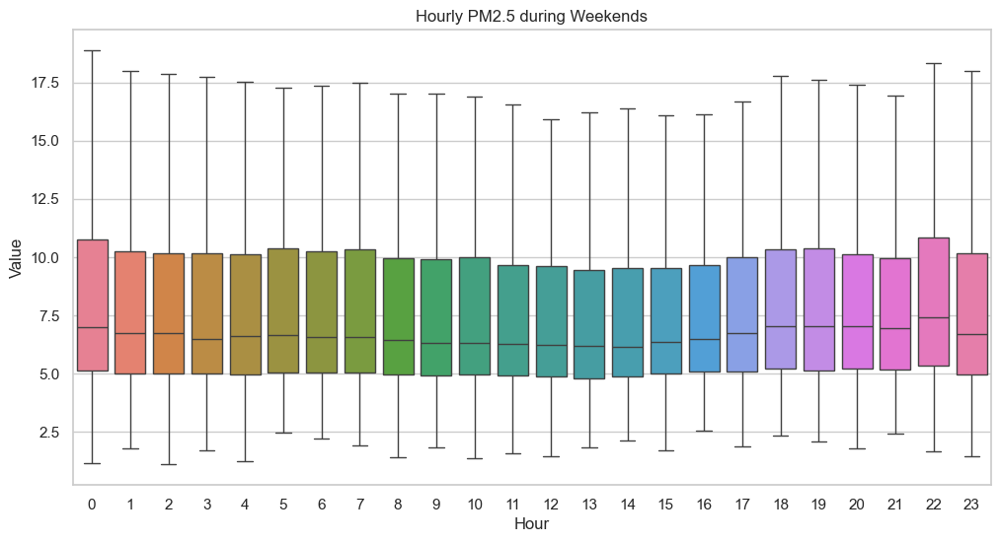

In [368]:
weekends = weather_new_copy[weather_new_copy['is_weekend'] == 1].pivot_table(
    index='date',
    columns='hour',
    values='pm25'
)
plt.figure(figsize=(12,6))
sns.boxplot(data=weekends, showfliers=False)
plt.title('Hourly PM2.5 during Weekends')
plt.xlabel('Hour')
plt.ylabel('Value')
plt.show()

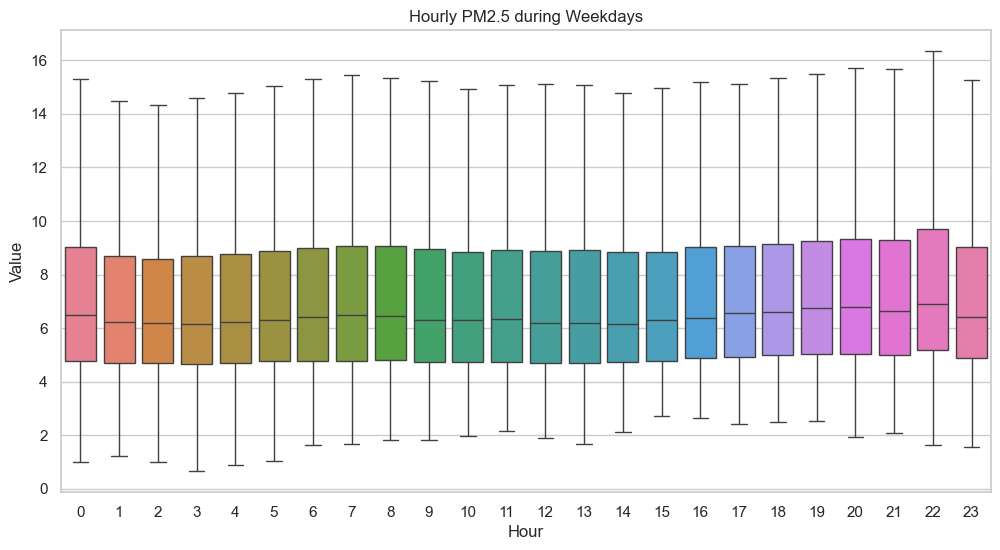

In [369]:
weekends = weather_new[weather_new['is_weekend'] !=1].pivot_table(
    index='date',
    columns='hour',
    values='pm25'
)
plt.figure(figsize=(12,6))
sns.boxplot(data=weekends, showfliers=False)
plt.title('Hourly PM2.5 during Weekdays')
plt.xlabel('Hour')
plt.ylabel('Value')
plt.show()

From observing both boxplots, it's clear that there is a rise during the weekends, the median, IQR are all much higher. So it's clear that people are travelling by car or other transportation a lot more during the weekends in comparison to weekdays.

# Observing patterns in polution

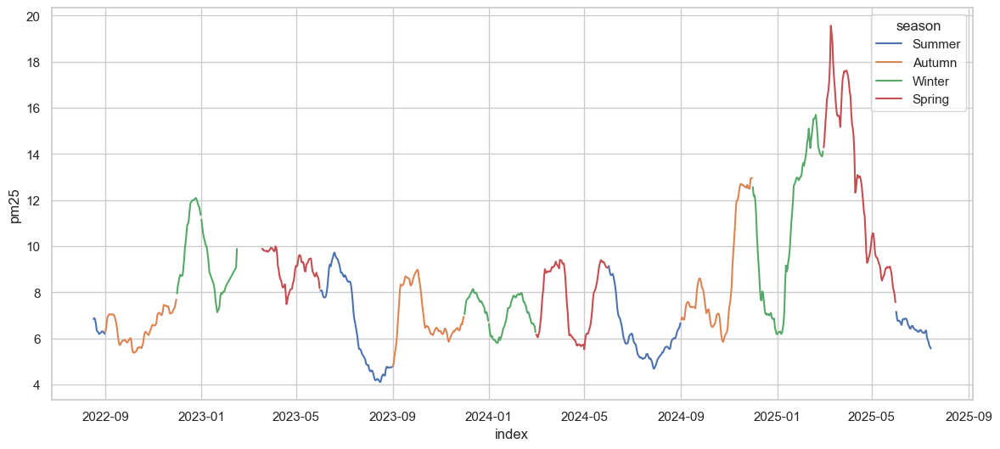

In [370]:
wind = weather_new.groupby(weather_new.index.date)['pm25'].mean().rolling(window=31).mean().reset_index()
month_to_season = {
    12: 'Winter', 1: 'Winter', 2: 'Winter',
    3: 'Spring', 4: 'Spring', 5: 'Spring',
    6: 'Summer', 7: 'Summer', 8: 'Summer',
    9: 'Autumn', 10: 'Autumn', 11: 'Autumn'
}

wind['index'] = pd.to_datetime(wind['index'])
wind['month'] = wind['index'].dt.month
wind['year'] = wind['index'].dt.year
wind['season'] = wind['month'].map(month_to_season)

wind['season_block'] = (wind['season'].ne(wind['season'].shift()) | wind['year'].ne(wind['year'].shift())).cumsum()
plt.figure(figsize=(14,6))
sns.lineplot(wind, x='index', y='pm25', hue='season', units='season_block')
plt.show()



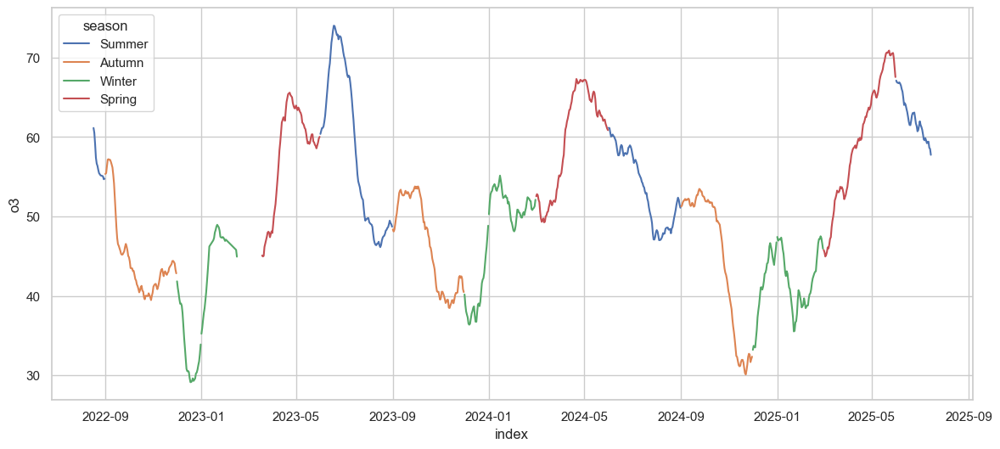

In [371]:
wind = weather_new.groupby(weather_new.index.date)['o3'].mean().rolling(window=31).mean().reset_index()
month_to_season = {
    12: 'Winter', 1: 'Winter', 2: 'Winter',
    3: 'Spring', 4: 'Spring', 5: 'Spring',
    6: 'Summer', 7: 'Summer', 8: 'Summer',
    9: 'Autumn', 10: 'Autumn', 11: 'Autumn'
}

wind['index'] = pd.to_datetime(wind['index'])
wind['month'] = wind['index'].dt.month
wind['year'] = wind['index'].dt.year
wind['season'] = wind['month'].map(month_to_season)

wind['season_block'] = (wind['season'].ne(wind['season'].shift()) | wind['year'].ne(wind['year'].shift())).cumsum()
plt.figure(figsize=(14,6))
sns.lineplot(wind, x='index', y='o3', hue='season', units='season_block')
plt.show()



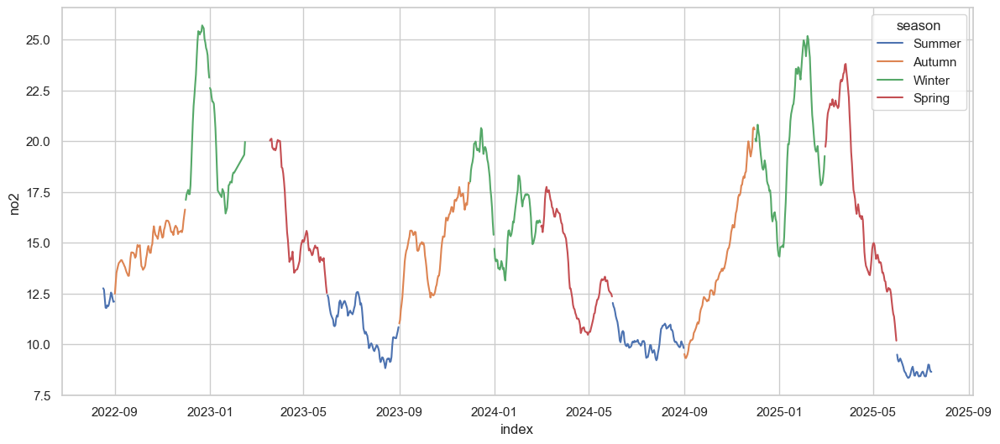

In [372]:
wind = weather_new.groupby(weather_new.index.date)['no2'].mean().rolling(window=31).mean().reset_index()
month_to_season = {
    12: 'Winter', 1: 'Winter', 2: 'Winter',
    3: 'Spring', 4: 'Spring', 5: 'Spring',
    6: 'Summer', 7: 'Summer', 8: 'Summer',
    9: 'Autumn', 10: 'Autumn', 11: 'Autumn'
}

wind['index'] = pd.to_datetime(wind['index'])
wind['month'] = wind['index'].dt.month
wind['year'] = wind['index'].dt.year
wind['season'] = wind['month'].map(month_to_season)

wind['season_block'] = (wind['season'].ne(wind['season'].shift()) | wind['year'].ne(wind['year'].shift())).cumsum()
plt.figure(figsize=(14,6))
sns.lineplot(wind, x='index', y='no2', hue='season', units='season_block')
plt.show()




There is a lot to unpack here, but first we need to using a rolling average instead of observing the data raw. This is because there is a lot of noise in data and so it would be more suitable if we used a rolling average to give us the patterns in full perspective. 

### PM2.5:
One would assume that PM2.5 would be highest during summer, however that is not the case here. It's safe to assume that during winter, households will turn on their heater which in turn will create greenhouse gasses since there is more demand for fuel. And of course during summer the polutant drops as there is no longer a need for heating. Furthermore, strangely the spring of 2025 had very high PM2.5. 

Why, you may ask? 

Well the truth is, there were several vegetation fires in early April 2025 which contributes to increase in fine particulate matter.

### O₃:

It's common for O₃ levels to peak during spring due to the increasing sunlight after winter and lower NO emissions compared to summer. However for mid-latitude regions, the peak may occur during summer


# Which Season Has The Highest Pollution?

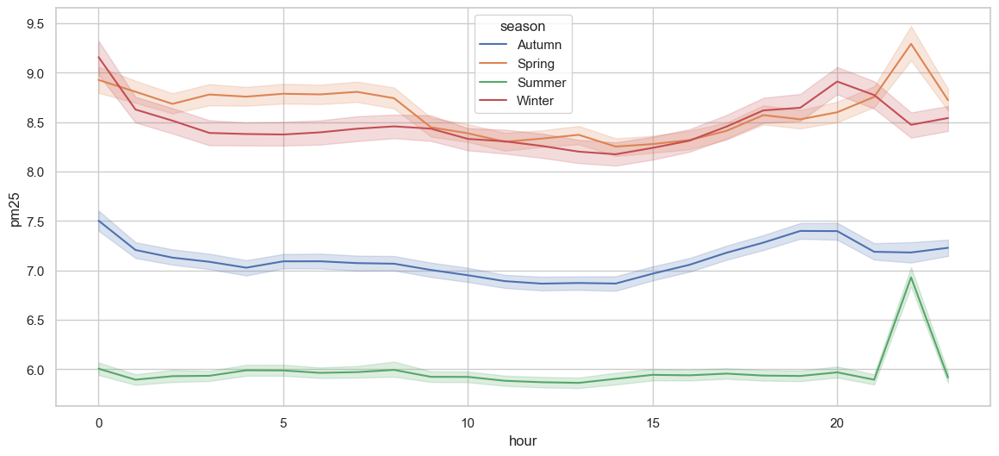

In [373]:
weather_new_copy = weather_new
weather_new_copy['month'] = weather_new_copy['time'].dt.month
weather_new_copy['season'] = weather_new_copy['month'].map(month_to_season)
weather_new_copy = (weather_new_copy.groupby(['season', 'hour'])['pm25']
 .apply(lambda x: x.rolling(2).mean())
 .dropna()
 .reset_index())
plt.figure(figsize=(14,6))
sns.lineplot(weather_new_copy, x='hour', y='pm25', hue='season')
plt.show()

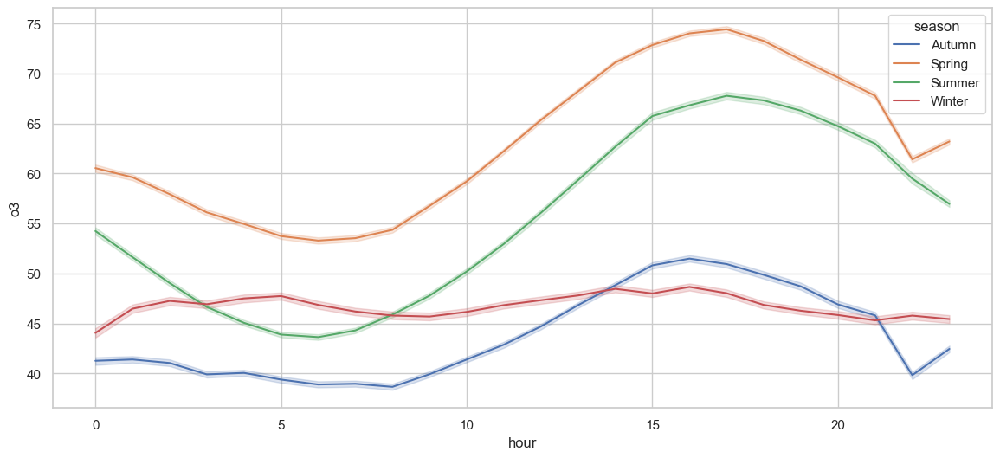

In [374]:
weather_new_copy = weather_new
weather_new_copy['month'] = weather_new_copy['time'].dt.month
weather_new_copy['season'] = weather_new_copy['month'].map(month_to_season)
weather_new_copy = (weather_new_copy.groupby(['season', 'hour'])['o3']
 .apply(lambda x: x.rolling(2).mean())
 .dropna()
 .reset_index())
plt.figure(figsize=(14,6))
sns.lineplot(weather_new_copy, x='hour', y='o3', hue='season')
plt.show()

We can see that during spring PM2.5 is the highest, this is mainly due to dust storms and pollen and perhaps argicultural burning with some asepct of weaker dispersion conditions. Meanwhile winter is more dominated by heating/combustion which makes sense.

In [383]:
weather_new = weather_new.iloc[:, :15]

It seems like during spring, o3 pollution is the highest, and second highest is summer, and for lowest it would be autumn. 

The reason the spring is the highest is due to the increase in sunlight and warming temperatures during spring which accelerates the increase, furthermore, in spring the atmospheric circulation patterns encourages downward transportation of ozone-rich air from the stratosphere into the troposphere. 

For autumn, there is less sunlight which implies less photochemical reactions, and due to cooler and wetter conditions, this leads to faster removal via deposition.

<div style="background-image: url('https://images.unsplash.com/photo-1506905925346-21bda4d32df4?w=1200');
            background-size: cover;
            background-position: center;
            height: 200px;
            border-radius: 15px;
            display: flex;
            align-items: center;
            justify-content: center;
            position: relative;">
    <div style="background: rgba(0,0,0,0.3); 
                padding: 20px; 
                border-radius: 10px; 
                color: white;
                text-align: center;">
        <h1 style="margin: 0;">Feature Engineering</h1>
    </div>
</div>


In [385]:
weather_new.index = weather_new['time']
weather_new['day_of_week'] = weather_new.index.day_of_week
weather_new['hour'] = weather_new.index.hour
weather_new['hour_sin'] = np.sin(2 * np.pi * weather_new['hour']/24)
weather_new['hour_cos'] = np.cos(2 * np.pi * weather_new['hour']/24)
weather_new['wind_humidity_interaction'] = weather_new['wind_speed_10m'] * weather_new['relative_humidity_2m']
weather_new['wind_dir_sin'] = np.sin(np.radians(weather_new['wind_direction_10m']))
weather_new['wind_dir_cos'] = np.cos(np.radians(weather_new['wind_direction_10m']))
weather_new['is_weekend'] = weather_new.index.day_of_week > 4
weather_new


,station,time,no2,o3,pm25,wind_speed_10m,wind_direction_10m,temperature_2m,relative_humidity_2m,precipitation,...,shortwave_radiation,is_holiday,day_of_week,hour,hour_sin,hour_cos,wind_humidity_interaction,wind_dir_sin,wind_dir_cos,is_weekend
time,,,,,,,,,,,,,,,,,,,,,
2022-07-17 00:00:00+00:00,Belfast Centre,2022-07-17 00:00:00+00:00,14.0,43.0,7.0,5.154415,114.775116,14.488000,86.647680,0.0,...,0.0,0,6,0,0.000000e+00,1.000000,446.618102,0.907960,-0.419058,True
2022-07-17 01:00:00+00:00,Belfast Centre,2022-07-17 01:00:00+00:00,16.0,40.0,7.0,4.680000,112.619910,13.938001,84.056150,0.0,...,0.0,0,6,1,2.588190e-01,0.965926,393.382807,0.923077,-0.384616,True
2022-07-17 02:00:00+00:00,Belfast Centre,2022-07-17 02:00:00+00:00,17.0,39.0,7.0,6.439876,153.435010,14.438001,78.723180,0.0,...,0.0,0,6,2,5.000000e-01,0.866025,506.967518,0.447213,-0.894428,True
2022-07-17 03:00:00+00:00,Belfast Centre,2022-07-17 03:00:00+00:00,17.0,39.0,7.0,7.172949,197.525670,14.888001,77.751450,1.1,...,0.0,0,6,3,7.071068e-01,0.707107,557.707186,-0.301133,-0.953582,True
2022-07-17 04:00:00+00:00,Belfast Centre,2022-07-17 04:00:00+00:00,9.0,40.0,7.0,5.623380,140.194470,14.888001,81.976660,1.3,...,0.0,0,6,4,8.660254e-01,0.500000,460.985886,0.640184,-0.768222,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-07-15 11:00:00+00:00,York Bootham,2025-07-15 11:00:00+00:00,NaN,38.0,NaN,15.137133,177.273740,16.161001,80.542470,1.1,...,188.0,0,1,11,2.588190e-01,-0.965926,1219.182081,0.047564,-0.998868,False
2025-07-15 12:00:00+00:00,York Bootham,2025-07-15 12:00:00+00:00,NaN,38.0,NaN,18.643690,169.992080,16.811000,76.275190,0.3,...,137.0,0,1,12,1.224647e-16,-1.000000,1422.050997,0.173784,-0.984784,False
2025-07-15 13:00:00+00:00,York Bootham,2025-07-15 13:00:00+00:00,NaN,35.0,NaN,22.528780,172.193700,15.361000,92.257970,1.6,...,164.0,0,1,13,-2.588190e-01,-0.965926,2078.459509,0.135825,-0.990733,False


In [387]:
weather_new.drop(['time'], axis=1, inplace=True)
weather_new = weather_new.sort_values(['station', 'time'])
weather_new['date'] = weather_new.index.date





In [388]:
weather_new = weather_new.reset_index()
weather_new['time'] = pd.to_datetime(weather_new['time'])
weather_new['pm25'] = np.log1p(weather_new['pm25'])
weather_new['o3'] = np.log1p(weather_new['o3'])
lags = [1, 2, 3, 6, 12, 24]
features_add = []
removal = []
polutant = ['o3', 'pm25']
for pol in polutant:
    for lag in lags:
        weather_new[f'{pol}_lag_{lag}'] = weather_new.groupby(['station'])[f'{pol}'].shift(lag)
        weather_new[f'time_shift_{lag}'] = weather_new.groupby('station')['time'].shift(lag)
        time_diff = weather_new['time'] - weather_new[f'time_shift_{lag}']
        weather_new.loc[time_diff > pd.Timedelta(hours=lag), f'{pol}_lag_{lag}'] = np.nan
        removal.append(f'time_shift_{lag}')
        features_add.append(f'{pol}_lag_{lag}')

weather_new.index = weather_new['time']
rollings = [1, 2, 3, 6, 12, 24]
polutant = ['pm25', 'o3']
for pol in polutant:
    for roll in rollings:
        weather_new[f'{pol}_rolling_{roll}'] = weather_new.groupby('station')[f'{pol}'].rolling(f'{roll}h', min_periods=1).mean().reset_index(level=0, drop=True)
        features_add.append(f'{pol}_rolling_{roll}')
        

for pol in polutant:
    for roll in rollings:
        weather_new[f'{pol}_rolling_std_{roll}'] = weather_new.groupby('station')[f'{pol}'].rolling(f'{roll}h', min_periods=1).std().reset_index(level=0, drop=True)
        features_add.append(f'{pol}_rolling_std_{roll}')


for pol in polutant:
    for roll in rollings:
        weather_new[f'{pol}_rolling_min_{roll}'] = weather_new.groupby('station')[f'{pol}'].rolling(f'{roll}h', min_periods=1).min().reset_index(level=0, drop=True)
        features_add.append(f'{pol}_rolling_min_{roll}')


for pol in polutant:
    for roll in rollings:
        weather_new[f'{pol}_rolling_max_{roll}'] = weather_new.groupby('station')[f'{pol}'].rolling(f'{roll}h', min_periods=1).max().reset_index(level=0, drop=True)
        features_add.append(f'{pol}_rolling_max_{roll}')

weather_new.drop(removal, axis=1, inplace=True)
weather_new


,time,station,no2,o3,pm25,wind_speed_10m,wind_direction_10m,temperature_2m,relative_humidity_2m,precipitation,...,pm25_rolling_max_3,pm25_rolling_max_6,pm25_rolling_max_12,pm25_rolling_max_24,o3_rolling_max_1,o3_rolling_max_2,o3_rolling_max_3,o3_rolling_max_6,o3_rolling_max_12,o3_rolling_max_24
time,,,,,,,,,,,,,,,,,,,,,
2022-07-17 00:00:00+00:00,2022-07-17 00:00:00+00:00,Belfast Centre,14.0,3.784190,2.079442,5.154415,114.775116,14.488000,86.647680,0.0,...,2.079442,2.079442,2.079442,2.079442,3.784190,3.784190,3.784190,3.784190,3.784190,3.784190
2022-07-17 01:00:00+00:00,2022-07-17 01:00:00+00:00,Belfast Centre,16.0,3.713572,2.079442,4.680000,112.619910,13.938001,84.056150,0.0,...,2.079442,2.079442,2.079442,2.079442,3.713572,3.784190,3.784190,3.784190,3.784190,3.784190
2022-07-17 02:00:00+00:00,2022-07-17 02:00:00+00:00,Belfast Centre,17.0,3.688879,2.079442,6.439876,153.435010,14.438001,78.723180,0.0,...,2.079442,2.079442,2.079442,2.079442,3.688879,3.713572,3.784190,3.784190,3.784190,3.784190
2022-07-17 03:00:00+00:00,2022-07-17 03:00:00+00:00,Belfast Centre,17.0,3.688879,2.079442,7.172949,197.525670,14.888001,77.751450,1.1,...,2.079442,2.079442,2.079442,2.079442,3.688879,3.688879,3.713572,3.784190,3.784190,3.784190
2022-07-17 04:00:00+00:00,2022-07-17 04:00:00+00:00,Belfast Centre,9.0,3.713572,2.079442,5.623380,140.194470,14.888001,81.976660,1.3,...,2.079442,2.079442,2.079442,2.079442,3.713572,3.713572,3.713572,3.784190,3.784190,3.784190
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-07-15 11:00:00+00:00,2025-07-15 11:00:00+00:00,York Bootham,NaN,3.663562,NaN,15.137133,177.273740,16.161001,80.542470,1.1,...,NaN,NaN,NaN,2.079442,3.663562,3.688879,3.713572,3.713572,3.713572,4.219508
2025-07-15 12:00:00+00:00,2025-07-15 12:00:00+00:00,York Bootham,NaN,3.663562,NaN,18.643690,169.992080,16.811000,76.275190,0.3,...,NaN,NaN,NaN,2.079442,3.663562,3.663562,3.688879,3.713572,3.713572,4.127134
2025-07-15 13:00:00+00:00,2025-07-15 13:00:00+00:00,York Bootham,NaN,3.583519,NaN,22.528780,172.193700,15.361000,92.257970,1.6,...,NaN,NaN,NaN,2.079442,3.583519,3.663562,3.663562,3.713572,3.713572,4.060443




<div style="background-image: url('https://www.esa.int/var/esa/storage/images/esa_multimedia/videos/2021/04/earth_views_from_space_1_hour_long_in_4k/23240791-1-eng-GB/Earth_views_from_space_1_hour_long_in_4K_pillars.jpg');
            background-size: cover;
            background-position: center;
            height: 200px;
            border-radius: 15px;
            display: flex;
            align-items: center;
            justify-content: center;
            position: relative;">
    <div style="background: rgba(0,0,0,0.3); 
                padding: 20px; 
                border-radius: 10px; 
                color: white;
                text-align: center;">
        <h1 style="margin: 0;"> Developing the Model</h1>
    </div>
</div>



In [389]:

weather_pm25_clean = weather_new.drop(
    ['no2', 'o3', 'o3_lag_1', 'o3_lag_2', 'o3_lag_3', 'o3_lag_6','o3_lag_12','o3_lag_24', 'date', 'o3_rolling_1', 'o3_rolling_2', 'o3_rolling_3', 'o3_rolling_6', 'o3_rolling_12', 'o3_rolling_24',
     'o3_rolling_min_1', 'o3_rolling_min_2', 'o3_rolling_min_3', 'o3_rolling_min_6', 'o3_rolling_min_12', 'o3_rolling_min_24', 'o3_rolling_max_1', 'o3_rolling_max_2', 'o3_rolling_max_3', 'o3_rolling_max_6', 'o3_rolling_max_12', 'o3_rolling_max_24',
     'o3_rolling_std_1', 'o3_rolling_std_2', 'o3_rolling_std_3', 'o3_rolling_std_6', 'o3_rolling_std_12', 'o3_rolling_std_24'],
    axis=1
)




In [390]:

weather_o3_clean = weather_new.drop(
        ['no2', 'pm25', 'pm25_lag_1', 'pm25_lag_2', 'pm25_lag_3', 'pm25_lag_6','pm25_lag_12','pm25_lag_24', 'date', 'pm25_rolling_3', 'pm25_rolling_6', 'pm25_rolling_12', 'pm25_rolling_24',
     'pm25_rolling_min_3', 'pm25_rolling_min_6', 'pm25_rolling_min_12', 'pm25_rolling_min_24', 'pm25_rolling_max_3', 'pm25_rolling_max_6', 'pm25_rolling_max_12', 'pm25_rolling_max_24','pm25_rolling_std_2', 'pm25_rolling_max_1', 'pm25_rolling_max_2', 'pm25_rolling_min_1', 'pm25_rolling_min_2',
     'pm25_rolling_std_3', 'pm25_rolling_std_6', 'pm25_rolling_std_12', 'pm25_rolling_std_24', 'pm25_rolling_2', 'pm25_rolling_1', 'pm25_rolling_std_1'],
    axis=1
)



In [391]:
weather_o3_clean['time'] = weather_o3_clean.index
weather_pm25_clean['time'] = weather_pm25_clean.index

In [392]:
def preprocess_df(df, pollutant, split, lower, upper):
    lower, upper = np.log1p(lower), np.log1p(upper)
    dataframe = df
    dataframe[f'{pollutant}_target_t_plus_12'] = dataframe.groupby('station')[f'{pollutant}'].shift(-12)
    weather_clean = dataframe.dropna(
    subset=[f'{pollutant}', f'{pollutant}_target_t_plus_12']
)

    weather_clean = weather_clean.sort_index()
    y = weather_clean[f'{pollutant}_target_t_plus_12']
    X = weather_clean.drop([f'{pollutant}_target_t_plus_12', 'time'], axis=1)

    # Create split 
    start_date = X.index.min()
    end_date = X.index.max()
    total_duration = end_date - start_date
    split_date = start_date + (total_duration * split)

    print(f"Split date: {split_date}")

    # Create temporal masks
    train_mask = X.index <= split_date
    test_mask = y.index > split_date

    X_train = X[train_mask]
    y_train = y[train_mask]
    X_test = X[test_mask]
    y_test = y[test_mask]

    
    print(f"Training period: {X_train.index.min()} to {X_train.index.max()}")
    print(f"Test period: {X_test.index.min()} to {X_test.index.max()}")
    print(f"Training samples: {len(X_train)} ({len(X_train)/len(X):.1%})")
    print(f"Test samples: {len(X_test)} ({len(X_test)/len(X):.1%})")

    # Filter sensor errors for training set
    outlier = (y_train <= lower) | (y_train > upper)
    y_train = y_train[~outlier]
    X_train = X_train[~outlier]

    # Filter sensor errors for test set
    outlier = (y_test <= lower) | (y_test > upper)
    y_test = y_test[~outlier]
    X_test = X_test[~outlier]

    #Log target so less susceptible to outliers
    y_train_log = y_train
    
    #Prepare persistance model
    # print(y_presistance.isna().sum())
    y_presistance = y[test_mask]
    y_presistance = y_presistance[~outlier]
    
    return X_train, y_train_log, X_test, y_test, y_presistance


In [393]:
X_pm25_train, y_pm25_train_log, X_pm25_test, y_pm25_test, y_pm25_pred_persistence_test= preprocess_df(weather_pm25_clean, 'pm25',0.66, lower  = 1.01, upper = 150)
X_o3_train, y_o3_train_log, X_o3_test, y_o3_test, y_o3_pred_persistence_test = preprocess_df(weather_o3_clean, 'o3', 0.66, lower  = 2.1, upper = 1000)


Split date: 2024-07-08 07:33:36+00:00
Training period: 2022-07-17 00:00:00+00:00 to 2024-07-08 07:00:00+00:00
Test period: 2024-07-08 08:00:00+00:00 to 2025-07-15 10:00:00+00:00
Training samples: 705346 (72.1%)
Test samples: 272535 (27.9%)
Split date: 2024-07-08 08:13:12+00:00
Training period: 2022-07-17 00:00:00+00:00 to 2024-07-08 08:00:00+00:00
Test period: 2024-07-08 09:00:00+00:00 to 2025-07-15 11:00:00+00:00
Training samples: 662378 (67.2%)
Test samples: 323654 (32.8%)


In [394]:
X_o3_train.columns

Index(['station', 'o3', 'wind_speed_10m', 'wind_direction_10m',
       'temperature_2m', 'relative_humidity_2m', 'precipitation', 'rain',
       'surface_pressure', 'pressure_msl', 'shortwave_radiation', 'is_holiday',
       'day_of_week', 'hour', 'hour_sin', 'hour_cos',
       'wind_humidity_interaction', 'wind_dir_sin', 'wind_dir_cos',
       'is_weekend', 'o3_lag_1', 'o3_lag_2', 'o3_lag_3', 'o3_lag_6',
       'o3_lag_12', 'o3_lag_24', 'o3_rolling_1', 'o3_rolling_2',
       'o3_rolling_3', 'o3_rolling_6', 'o3_rolling_12', 'o3_rolling_24',
       'o3_rolling_std_1', 'o3_rolling_std_2', 'o3_rolling_std_3',
       'o3_rolling_std_6', 'o3_rolling_std_12', 'o3_rolling_std_24',
       'o3_rolling_min_1', 'o3_rolling_min_2', 'o3_rolling_min_3',
       'o3_rolling_min_6', 'o3_rolling_min_12', 'o3_rolling_min_24',
       'o3_rolling_max_1', 'o3_rolling_max_2', 'o3_rolling_max_3',
       'o3_rolling_max_6', 'o3_rolling_max_12', 'o3_rolling_max_24'],
      dtype='object')

What we're doing here is preprocessing the data, we first split the data into training and testing, then remove outliers, these outliers are most probably sensor error. It's important to remove these as they can mislead the model.

<div style="background: linear-gradient(90deg, #34495e 0%, #2c3e50 100%);
            height: 50px;
            border-radius: 8px;
            display: flex;
            align-items: center;
            padding-left: 20px;
            box-shadow: 0 1px 4px rgba(0,0,0,0.1);">
    <h3 style="margin: 0; 
               color: #ecf0f1; 
               font-size: 1.05em; 
               font-weight: 400;">
        1.1 Developing the Model to Predict PM2.5
    </h3>
</div>

Now, what we essentially want here is to create a baseline, this baseline is what we hope to beat through tuning.

In [498]:
xg_reg_pm25 = xgb.XGBRegressor()

In [499]:
n_splits = 5 
tscv = TimeSeriesSplit(n_splits)
validation_results = []
for fold, (train_idx, test_idx) in enumerate(tscv.split(X_pm25_train)):
    print("Fold: {}".format(fold))
    print("TRAIN indices:", train_idx, "\n", "TEST indices:", test_idx)
    X_train, X_test = X_pm25_train.iloc[train_idx], X_pm25_train.iloc[test_idx]
    y_train, y_test = y_pm25_train_log.iloc[train_idx], y_pm25_train_log.iloc[test_idx]
    
    
    
    encoder = ce.TargetEncoder(cols=['station', 'day_of_week'], handle_unknown='return_nan', handle_missing='return_nan')
    X_train = encoder.fit_transform(X_train, y_train)
    X_test = encoder.transform(X_test)
    
    xg_reg_pm25.fit(X_train, y_train,
               eval_set=[(X_test, y_test)],
               verbose=True)
    validation_results.append(xg_reg_pm25.evals_result())



Fold: 0
TRAIN indices: [     0      1      2 ... 116463 116464 116465] 
 TEST indices: [116466 116467 116468 ... 232924 232925 232926]
[0]	validation_0-rmse:0.52225
[1]	validation_0-rmse:0.47842
[2]	validation_0-rmse:0.44722
[3]	validation_0-rmse:0.42671
[4]	validation_0-rmse:0.42025
[5]	validation_0-rmse:0.40915
[6]	validation_0-rmse:0.40394
[7]	validation_0-rmse:0.40320
[8]	validation_0-rmse:0.40418
[9]	validation_0-rmse:0.40597
[10]	validation_0-rmse:0.40395
[11]	validation_0-rmse:0.40325
[12]	validation_0-rmse:0.40425
[13]	validation_0-rmse:0.40298
[14]	validation_0-rmse:0.40271
[15]	validation_0-rmse:0.40175
[16]	validation_0-rmse:0.39905
[17]	validation_0-rmse:0.40071
[18]	validation_0-rmse:0.40049
[19]	validation_0-rmse:0.40099
[20]	validation_0-rmse:0.40045
[21]	validation_0-rmse:0.40024
[22]	validation_0-rmse:0.40180
[23]	validation_0-rmse:0.40274
[24]	validation_0-rmse:0.40080
[25]	validation_0-rmse:0.39720
[26]	validation_0-rmse:0.40016
[27]	validation_0-rmse:0.40025
[28]	va

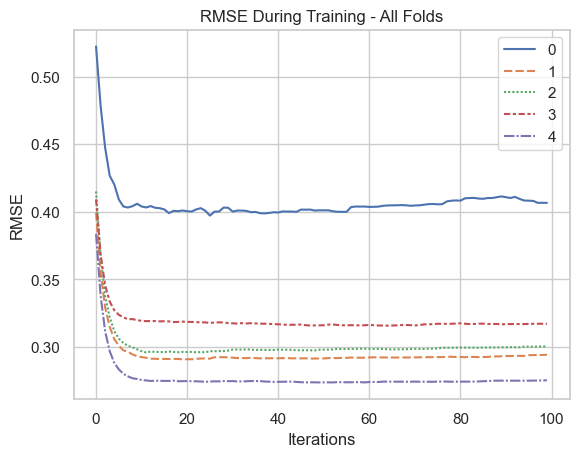

In [500]:
unpacked_results = [res['validation_0']['rmse'] for res in validation_results]
sns.lineplot(unpacked_results)
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.title('RMSE During Training - All Folds')
plt.show()

The RMSE is decent for random hyperparameters, however this is not adequate for predicting PM2.5 as the range is between 4-9 PM2.5 and so that is quite a large jump. Therefore to improve this we will be tuning our model using Optuna.

Fold: 0
TRAIN indices: [     0      1      2 ... 116463 116464 116465] 
 TEST indices: [116466 116467 116468 ... 232924 232925 232926]


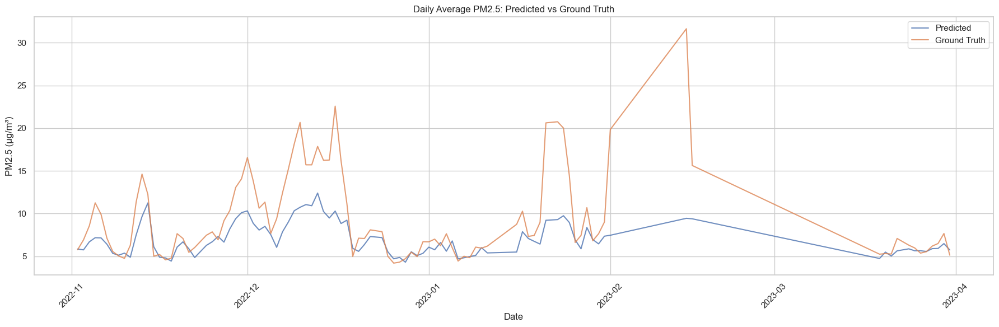

5.9902352681530076
Fold: 1
TRAIN indices: [     0      1      2 ... 232924 232925 232926] 
 TEST indices: [232927 232928 232929 ... 349385 349386 349387]


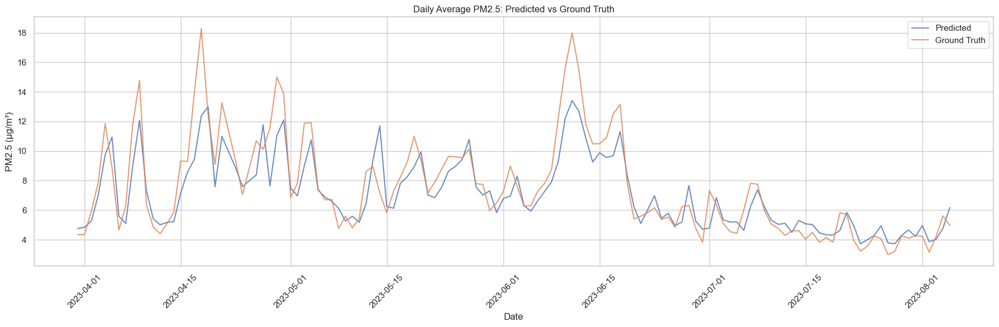

2.9109792587057273
Fold: 2
TRAIN indices: [     0      1      2 ... 349385 349386 349387] 
 TEST indices: [349388 349389 349390 ... 465846 465847 465848]


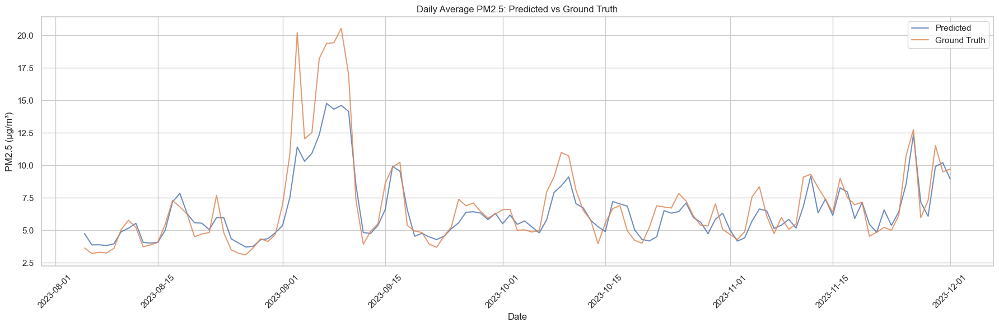

3.065992835642154
Fold: 3
TRAIN indices: [     0      1      2 ... 465846 465847 465848] 
 TEST indices: [465849 465850 465851 ... 582307 582308 582309]


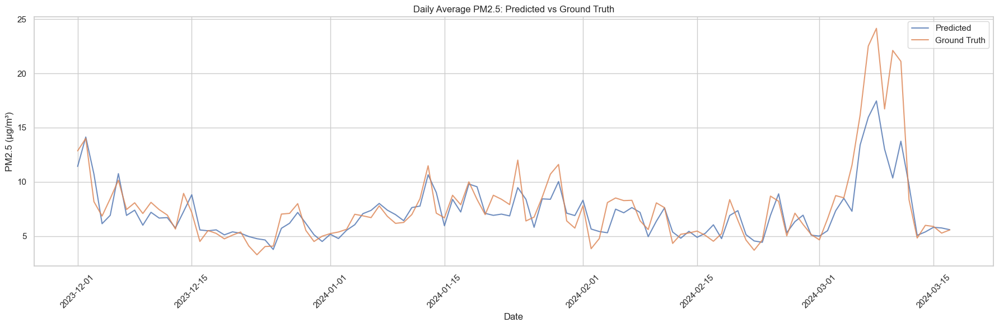

3.1795730517047085
Fold: 4
TRAIN indices: [     0      1      2 ... 582307 582308 582309] 
 TEST indices: [582310 582311 582312 ... 698768 698769 698770]


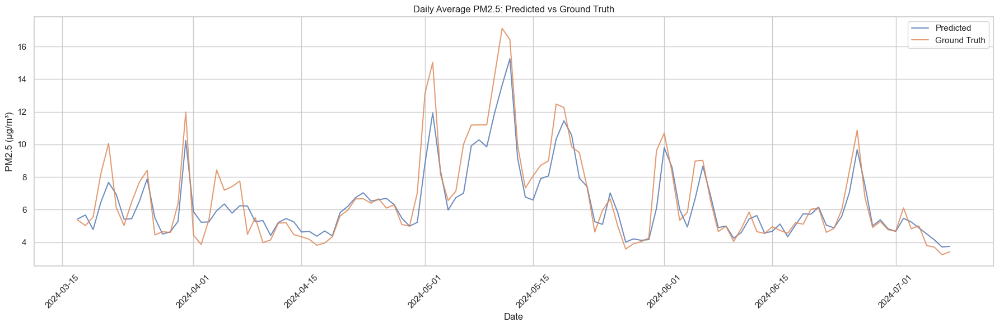

2.5461237714948117


In [427]:
n_splits = 5
tscv = TimeSeriesSplit(n_splits)

#{'alpha': 2.718725070863653, 'quantile_alpha': 0.7507345239692093, 'lambda': 9.979213030002173, 'colsample_bytree': 0.5, 'colsample_bylevel': 0.5, 'learning_rate': 0.05793723477706892, 'n_estimators': 1069, 'max_depth': 13, 'min_child_weight': 12}
xg_mid = xgb.XGBRegressor(
    objective='reg:quantileerror',
    quantile_alpha=0.487,
    reg_lambda=7.59,
    reg_alpha=3.65,
    colsample_bytree=0.5,
    colsample_bylevel=0.5,
    subsample=1,
    learning_rate=0.017,
    n_estimators=1979,
    max_depth=13,
    min_child_weight=20,
    random_state=42,
    verbose=0,
    early_stopping_rounds=50,
    tree_method='gpu_hist',
    predictor='gpu_predictor'
)

validation_results = []
for fold, (train_idx, test_idx) in enumerate(tscv.split(X_pm25_train)):
    print("Fold: {}".format(fold))
    print("TRAIN indices:", train_idx, "\n", "TEST indices:", test_idx)
    
    #Slice dataframe based  on splits
    X_train, X_test = X_pm25_train.iloc[train_idx], X_pm25_train.iloc[test_idx]
    y_train, y_test = y_pm25_train_log.iloc[train_idx], y_pm25_train_log.iloc[test_idx]
    
    #Encode categorical variables
    encoder = ce.TargetEncoder(cols=['station', 'day_of_week'], handle_unknown='return_nan', handle_missing='return_nan')
    X_train = encoder.fit_transform(X_train, y_train)
    X_test = encoder.transform(X_test)
    
    #Train model and predict testing set
    xg_mid.fit(X_train, y_train,
            eval_set=[(X_test, y_test)],
            verbose=0)
    res = xg_mid.predict(X_test)
    ensemble_pred = np.expm1(res)
    
    #Create plot showing validation set progress
    df_test = pd.DataFrame({
    "date": X_test.index,   
    "pm25_predicted": ensemble_pred,
    "pm25_ground": np.expm1(y_test),
    })

    # Convert to datetime if not already
    df_test["date"] = pd.to_datetime(df_test["date"])

    # Group by day and take the mean
    daily_avg_pred = df_test.groupby(df_test["date"].dt.date)["pm25_predicted"].mean()
    daily_avg_ground = df_test.groupby(df_test["date"].dt.date)["pm25_ground"].mean()

    plt.figure(figsize=(18, 6))
    plt.plot(daily_avg_pred.index, daily_avg_pred.values, label='Predicted', alpha=0.8)
    plt.plot(daily_avg_ground.index, daily_avg_ground.values, label='Ground Truth', alpha=0.8)
    plt.xlabel('Date')
    plt.ylabel('PM2.5 (µg/m³)')
    plt.title('Daily Average PM2.5: Predicted vs Ground Truth')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    print(root_mean_squared_error(np.expm1(y_test), ensemble_pred))

    validation_results.append(xg_mid.evals_result())

# Save model
# xg_mid.save_model('xg_mid.model') 

Fold: 0
TRAIN indices: [     0      1      2 ... 116463 116464 116465] 
 TEST indices: [116466 116467 116468 ... 232924 232925 232926]


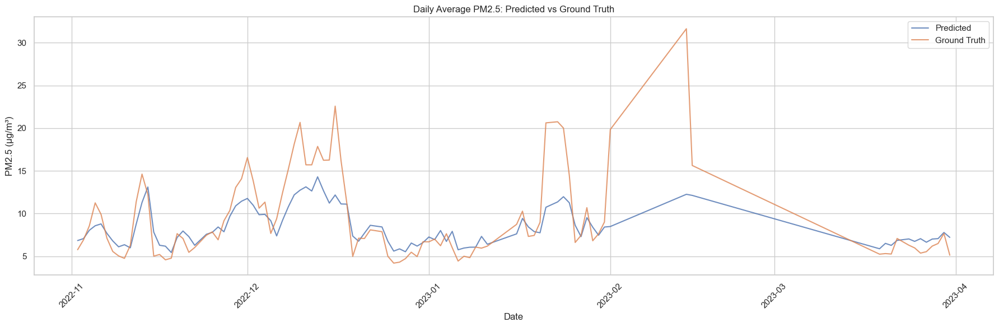

5.451154855624627
Fold: 1
TRAIN indices: [     0      1      2 ... 232924 232925 232926] 
 TEST indices: [232927 232928 232929 ... 349385 349386 349387]


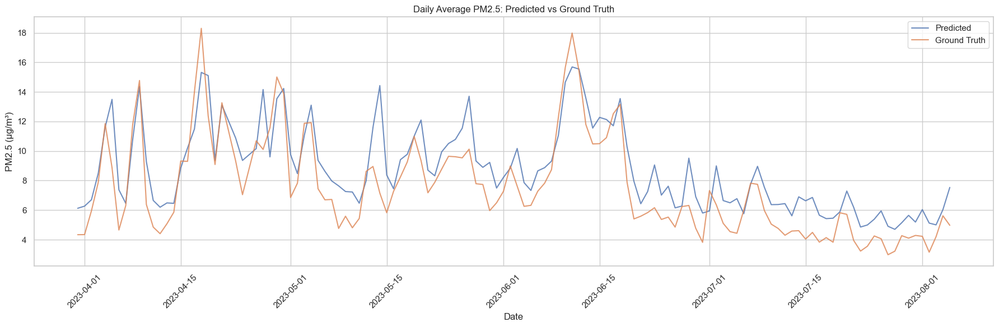

3.069949319035775
Fold: 2
TRAIN indices: [     0      1      2 ... 349385 349386 349387] 
 TEST indices: [349388 349389 349390 ... 465846 465847 465848]


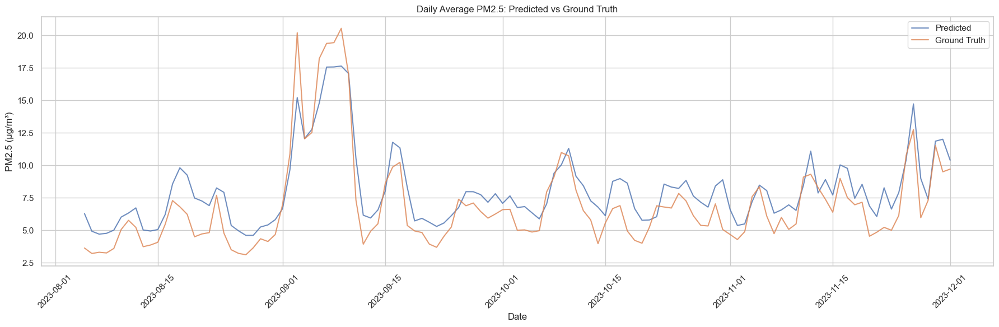

3.1238071558612317
Fold: 3
TRAIN indices: [     0      1      2 ... 465846 465847 465848] 
 TEST indices: [465849 465850 465851 ... 582307 582308 582309]


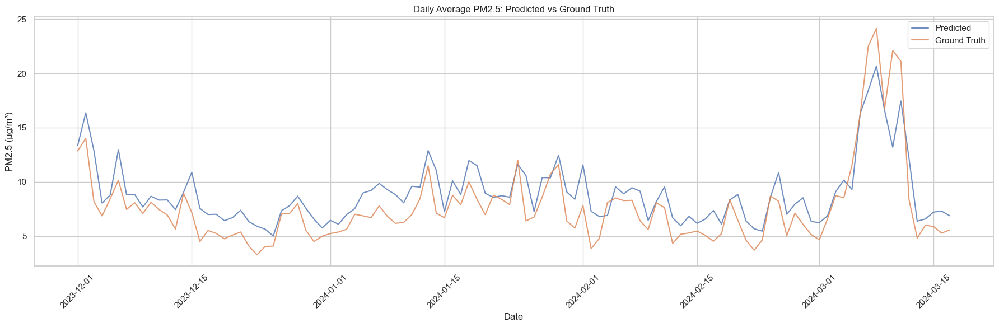

3.3744685889386203
Fold: 4
TRAIN indices: [     0      1      2 ... 582307 582308 582309] 
 TEST indices: [582310 582311 582312 ... 698768 698769 698770]


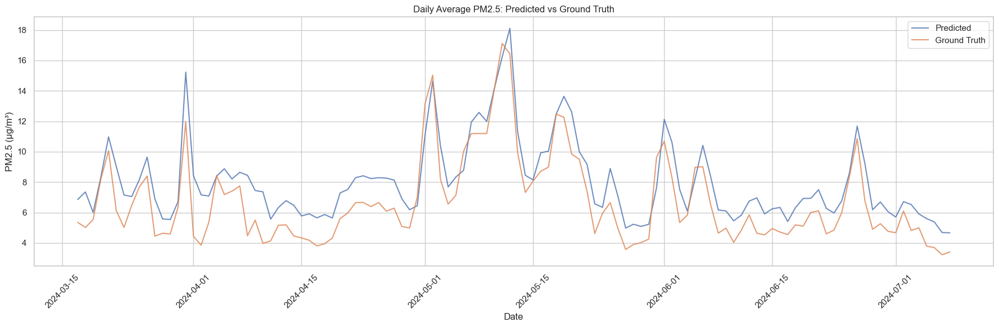

2.7788763018859637


In [426]:
n_splits = 5
tscv = TimeSeriesSplit(n_splits)

#{'alpha': 4.101844277859214, 'quantile_alpha': 0.8001088748756277, 'lambda': 4.336133542532513, 'colsample_bytree': 0.5, 'colsample_bylevel': 0.5, 'learning_rate': 0.015458111541603124, 'n_estimators': 1002, 'max_depth': 11, 'min_child_weight': 18}
xg_90 = xgb.XGBRegressor(
    objective='reg:quantileerror',
    quantile_alpha=0.80010,
    reg_lambda=4.336,
    reg_alpha=4.101844277859214,
    colsample_bytree=0.5,
    colsample_bylevel=0.5,
    subsample=1,
    learning_rate=0.0154581,
    n_estimators=1002,
    max_depth=11,
    min_child_weight=18,
    random_state=42,
    verbose=0,
    early_stopping_rounds=50,
    tree_method='gpu_hist',
    predictor='gpu_predictor'
)

validation_results = []
for fold, (train_idx, test_idx) in enumerate(tscv.split(X_pm25_train)):
    print("Fold: {}".format(fold))
    print("TRAIN indices:", train_idx, "\n", "TEST indices:", test_idx)
    X_train, X_test = X_pm25_train.iloc[train_idx], X_pm25_train.iloc[test_idx]
    y_train, y_test = y_pm25_train_log.iloc[train_idx], y_pm25_train_log.iloc[test_idx]
    

    encoder = ce.TargetEncoder(cols=['station', 'day_of_week'], handle_unknown='return_nan', handle_missing='return_nan')
    X_train = encoder.fit_transform(X_train, y_train)
    X_test = encoder.transform(X_test)
    
    xg_90.fit(X_train, y_train,
            eval_set=[(X_test, y_test)],
            verbose=0)
    res = xg_90.predict(X_test)
    ensemble_pred = np.expm1(res)
    df_test = pd.DataFrame({
    "date": X_test.index,   # replace "date" with your actual datetime column name
    "pm25_predicted": ensemble_pred,
    "pm25_ground": np.expm1(y_test),
    })

    # Convert to datetime if not already
    df_test["date"] = pd.to_datetime(df_test["date"])

    # Group by day and take the mean
    daily_avg_pred = df_test.groupby(df_test["date"].dt.date)["pm25_predicted"].mean()
    daily_avg_ground = df_test.groupby(df_test["date"].dt.date)["pm25_ground"].mean()

    plt.figure(figsize=(18, 6))
    plt.plot(daily_avg_pred.index, daily_avg_pred.values, label='Predicted', alpha=0.8)
    plt.plot(daily_avg_ground.index, daily_avg_ground.values, label='Ground Truth', alpha=0.8)
    plt.xlabel('Date')
    plt.ylabel('PM2.5 (µg/m³)')
    plt.title('Daily Average PM2.5: Predicted vs Ground Truth')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    print(root_mean_squared_error(np.expm1(y_test), ensemble_pred))

    validation_results.append(xg_90.evals_result())

In [425]:

#{'learning_rate': 0.041339276793970856, 'n_estimators': 688, 'max_depth': 8, 'min_child_weight': 3, 'gamma': 1.2237773035237614, 'subsample': 0.8456036230372825, 'colsample_bytree': 0.6557306933760569, 'colsample_bylevel': 0.9537285438856942, 'scale_pos_weight': 1.0154290444016436}
n_splits = 5
threshold = 12
tscv = TimeSeriesSplit(n_splits)
binary_classifier = model = xgb.XGBClassifier(
    learning_rate=0.04134,
    n_estimators=688,
    max_depth=8,
    min_child_weight=3,
    gamma=1.2238,
    subsample=0.8456,
    colsample_bytree=0.6557,
    colsample_bylevel=0.9537,
    scale_pos_weight=1.0154,
    objective='binary:logistic',
    random_state=42,
    tree_method='gpu_hist',
    predictor='gpu_predictor'
)
f12 = []

binary_pm25_test = (y_pm25_train_log > np.log1p(threshold)).astype(int)
for fold, (train_idx, test_idx) in enumerate(tscv.split(X_pm25_train)):
    print("Fold: {}".format(fold))
    print("TRAIN indices:", train_idx, "\n", "TEST indices:", test_idx)
    X_train, X_test = X_pm25_train.iloc[train_idx], X_pm25_train.iloc[test_idx]
    y_train, y_test = binary_pm25_test.iloc[train_idx], binary_pm25_test.iloc[test_idx]
    
    encoder = ce.TargetEncoder(cols=['station', 'day_of_week'], handle_unknown='return_nan', handle_missing='return_nan')
    X_train = encoder.fit_transform(X_train, y_train)
    X_test = encoder.transform(X_test)
    
    binary_classifier.fit(X_train, y_train,
            eval_set=[(X_test, y_test)],
            verbose=0)
    predict_prob = binary_classifier.predict_proba(X_test)[:, 1]

    # For ROC-AUC
    fpr, tpr, thresholds = metrics.roc_curve(y_test, predict_prob, pos_label=1)
    auc = metrics.auc(fpr, tpr)

    # For F1-score (binary)
    threshold = 0.25  
    predict_label = (predict_prob > threshold).astype(int)
    f1 = metrics.f1_score(y_test, predict_label)
    print(f'F1 {f1}')

# binary_classifier.save_model('binary_classifier.model')

Fold: 0
TRAIN indices: [     0      1      2 ... 116463 116464 116465] 
 TEST indices: [116466 116467 116468 ... 232924 232925 232926]
F1 0.47076561227874436
Fold: 1
TRAIN indices: [     0      1      2 ... 232924 232925 232926] 
 TEST indices: [232927 232928 232929 ... 349385 349386 349387]
F1 0.6486892736892736
Fold: 2
TRAIN indices: [     0      1      2 ... 349385 349386 349387] 
 TEST indices: [349388 349389 349390 ... 465846 465847 465848]
F1 0.6906772778950788
Fold: 3
TRAIN indices: [     0      1      2 ... 465846 465847 465848] 
 TEST indices: [465849 465850 465851 ... 582307 582308 582309]
F1 0.6120153684945862
Fold: 4
TRAIN indices: [     0      1      2 ... 582307 582308 582309] 
 TEST indices: [582310 582311 582312 ... 698768 698769 698770]
F1 0.6578429319371728




<div style="background-image: url('https://www.esa.int/var/esa/storage/images/esa_multimedia/videos/2021/04/earth_views_from_space_1_hour_long_in_4k/23240791-1-eng-GB/Earth_views_from_space_1_hour_long_in_4K_pillars.jpg');
            background-size: cover;
            background-position: center;
            height: 200px;
            border-radius: 15px;
            display: flex;
            align-items: center;
            justify-content: center;
            position: relative;">
    <div style="background: rgba(0,0,0,0.3); 
                padding: 20px; 
                border-radius: 10px; 
                color: white;
                text-align: center;">
        <h1 style="margin: 0;">1. Tuning hyperparameters</h1>
    </div>
</div>



# Tuning PM2.5 Upper Model

In [ ]:
n_splits = 3 # reducing the amount of folds to speed up tuning
tscv = TimeSeriesSplit(n_splits)
#{'lambda': 7.019586323585372, 'alpha': 3.470246677131541, 'colsample_bytree': 0.5, 'colsample_bylevel': 1.0, 'subsample': 1.0, 'learning_rate': 0.04651614023514727, 'n_estimators': 878, 'max_depth': 11, 'min_child_weight': 1}
# {'lambda': 9.840040949863173, 'alpha': 5.091480948913947, 'colsample_bytree': 0.5, 'colsample_bylevel': 0.5, 'subsample': 1.0, 'learning_rate': 0.0158465614994074, 'n_estimators': 1725, 'max_depth': 13, 'min_child_weight': 1}
#{'lambda': 8.454142731565085, 'alpha': 3.984447249171694, 'colsample_bytree': 0.5, 'colsample_bylevel': 0.5, 'subsample': 1.0, 'learning_rate': 0.015679047597583706, 'n_estimators': 1593, 'max_depth': 13, 'min_child_weight': 1}. Best is trial 152 with value:

y_pm25_train = np.expm1(y_pm25_train_log)
y_pm25_train_upper = y_pm25_train[y_pm25_train > 12]
X_pm25_train_upper = X_pm25_train.loc[y_pm25_train > 12]
def objective(trial, data=X_pm25_train_upper, target=y_pm25_train_upper):
    param = {
        'objective': 'reg:quantileerror',
        'alpha': trial.suggest_loguniform('alpha', 2, 7),
        'quantile_alpha': trial.suggest_float('quantile_alpha', 0.8, 0.99),  # good for peaks
        'lambda': trial.suggest_loguniform('lambda', 2, 10),
        'colsample_bytree': trial.suggest_categorical('colsample_bytree', [0.5, 0.7, 0.9, 1.0]),
        'colsample_bylevel': trial.suggest_categorical('colsample_bylevel', [0.5, 0.7, 0.9, 1.0]),
        'subsample': 1.0,
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),
        'n_estimators': trial.suggest_int('n_estimators', 800, 2000),
        'max_depth': trial.suggest_categorical('max_depth', [10, 11, 13]),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 20),
        'random_state': 42,
        'early_stopping_rounds': 50,
        'tree_method': 'gpu_hist',
        'predictor': 'gpu_predictor'
    }
    
    rmse_list = []
    for fold, (train_idx, val_idx) in enumerate(tscv.split(data)):
        X_train = data.iloc[train_idx]
        y_train = target.iloc[train_idx]

        X_val = data.iloc[val_idx]
        y_val = target.iloc[val_idx]
        encoder = ce.TargetEncoder(cols=['station', 'day_of_week'], handle_unknown='return_nan', handle_missing='return_nan')
        X_train = encoder.fit_transform(X_train, y_train)

        X_val = encoder.transform(X_val)
    
        model = xgb.XGBRegressor(**param)
        model.fit(X_train, y_train,
            eval_set=[(X_val, y_val)],
            verbose=False)
        predicted = model.predict(X_val)
        rmse = root_mean_squared_error(y_val, predicted)
        rmse_list.append(rmse)
    return np.mean(rmse_list)


In [ ]:
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=200)
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)

# Tuning PM2.5 Binary Classifier

In [ ]:
n_splits = 3 # reducing the amount of folds to speed up tuning
tscv = TimeSeriesSplit(n_splits)

threshold = 12
binary_pm25_test = (y_pm25_train > threshold).astype(int)

def objective(trial, data=X_pm25_train, target=binary_pm25_test):
    param = {
        'objective': 'binary:logistic',
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),
        'n_estimators': trial.suggest_int('n_estimators', 500, 2000),
        'max_depth': trial.suggest_int('max_depth', 6, 12),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'gamma': trial.suggest_float('gamma', 0, 5),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'colsample_bylevel': trial.suggest_float('colsample_bylevel', 0.6, 1.0),
        'scale_pos_weight': trial.suggest_float('scale_pos_weight', 1, 10),
        'random_state': 42,
        'tree_method': 'gpu_hist',
        'predictor': 'gpu_predictor',
        'early_stopping_rounds': 50
    }
    
    f1_list = []
    for fold, (train_idx, val_idx) in enumerate(tscv.split(data)):
        X_train = data.iloc[train_idx]
        y_train = target.iloc[train_idx]

        X_val = data.iloc[val_idx]
        y_val = target.iloc[val_idx]
        
        encoder = ce.TargetEncoder(cols=['station', 'day_of_week'], handle_unknown='return_nan', handle_missing='return_nan')
        X_train = encoder.fit_transform(X_train, y_train)

        X_val = encoder.transform(X_val)
    
        model = xgb.XGBClassifier(**param)
        
        model.fit(X_train, y_train,
                eval_set=[(X_val, y_val)],
                verbose=0)
        threshold = 0.25  
        predict_prob = model.predict_proba(X_val)[:, 1]
        predict_label = (predict_prob > threshold).astype(int)
        
        f1 = metrics.f1_score(y_val, predict_label)
        f1_list.append(f1)
    return np.mean(f1_list)

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=200)
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)

In [429]:
import category_encoders as ce
import numpy as np

# --- TargetEncoder ---
encoder = ce.TargetEncoder(
    cols=['station', 'day_of_week'], 
    handle_unknown='return_nan', 
    handle_missing='return_nan'
)
X_train_encoded = encoder.fit_transform(X_pm25_train, y_pm25_train_log)  # log target
X_test_encoded = encoder.transform(X_pm25_test)


# ---Binary---
threshold = 0.25  
predict_prob = binary_classifier.predict_proba(X_test_encoded)[:, 1]
predict_label = (predict_prob > threshold)



final_pred = np.zeros(len(X_test_encoded))
final_pred[~predict_label] = xg_mid.predict(X_test_encoded.loc[~predict_label])
final_pred[predict_label] = xg_90.predict(X_test_encoded.loc[predict_label])
pam = pd.DataFrame(final_pred, index=X_test_encoded.index, columns=['pm2.5_predicted'])

root_mean_squared_error(np.expm1(y_pm25_test), np.expm1(pam))


3.843076099146064

In [430]:
import category_encoders as ce
import numpy as np

# --- TargetEncoder ---
encoder = ce.TargetEncoder(
    cols=['station', 'day_of_week'], 
    handle_unknown='return_nan', 
    handle_missing='return_nan'
)
X_train_encoded = encoder.fit_transform(X_pm25_train, y_pm25_train_log)  # log target
X_test_encoded = encoder.transform(X_pm25_test)


# ---Binary---
threshold = 0.25  # you can change this to increase recall or precision
predict_prob = binary_classifier.predict_proba(X_test_encoded)[:, 1]
preds = predict_prob * xg_90.predict(X_test_encoded) + (1 - predict_prob) * xg_mid.predict(X_test_encoded)
sad = preds
root_mean_squared_error(np.expm1(y_pm25_test), np.expm1(preds))


3.8377921075922607

In [431]:
print('Performance of custom model: ')
evaluate_model(np.expm1(y_pm25_test), np.expm1(preds), False)
print('\n')
print('Performance of persistance model:')
evaluate_model(np.expm1(y_pm25_test), np.expm1(X_pm25_test['pm25']), False)

Performance of custom model: 
MAE: 2.0714027516355555 
 R2: 0.5844683365240839 
 MSE: 14.728648261097447 
 RMSE: 3.8377921075922607


Performance of persistance model:
MAE: 2.406590975162972 
 R2: 0.4345478636543576 
 MSE: 20.042625765397993 
 RMSE: 4.476899123880054


In [856]:
idx = np.where(np.expm1(y_pm25_test) < 15)[0]
root_mean_squared_error(np.expm1(y_pm25_test.iloc[idx]), np.expm1(preds[idx]))

2.4813004722327765

In [857]:
idx = np.where(np.expm1(y_pm25_test) > 15)[0]
root_mean_squared_error(np.expm1(y_pm25_test.iloc[idx]), np.expm1(preds[idx]))

10.729626714907978

In [863]:
idx = np.where(np.expm1(X_pm25_test['pm25']) < 15)[0]
root_mean_squared_error(np.expm1(y_pm25_test).iloc[idx], np.expm1(X_pm25_test['pm25'])[idx])

3.2138918599030335

In [861]:
idx = np.where(np.expm1(X_pm25_test['pm25']) > 15)[0]
root_mean_squared_error(np.expm1(y_pm25_test).iloc[idx], np.expm1(X_pm25_test['pm25'])[idx])

11.563353095243816

From observing the results, we can see that our model beats the persistance model in nearly all aspects, however it can be seen that our model starts to struggle when predicting peaks, this makes sense as peaks are harder to predict without precursors. 
Speaking about the persistance model, we can see that our model also beats the persistance model in peaks and non peaks prediction.

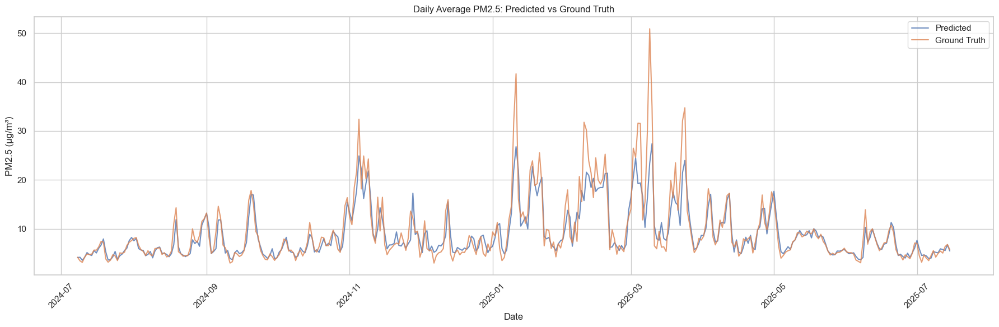

In [432]:
df_test = pd.DataFrame({
    "date": X_pm25_test.index,   # replace "date" with your actual datetime column name
    "pm25_predicted": np.expm1(preds),
    "pm25_ground": np.expm1(y_pm25_test),
})

# Convert to datetime if not already
df_test["date"] = pd.to_datetime(df_test["date"])

# Group by day and take the mean
daily_avg_pred = df_test.groupby(df_test["date"].dt.date)["pm25_predicted"].mean()
daily_avg_ground = df_test.groupby(df_test["date"].dt.date)["pm25_ground"].mean()

plt.figure(figsize=(18, 6))
plt.plot(daily_avg_pred.index, daily_avg_pred.values, label='Predicted', alpha=0.8)
plt.plot(daily_avg_ground.index, daily_avg_ground.values, label='Ground Truth', alpha=0.8)
plt.xlabel('Date')
plt.ylabel('PM2.5 (µg/m³)')
plt.title('Daily Average PM2.5: Predicted vs Ground Truth')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


<Axes: >

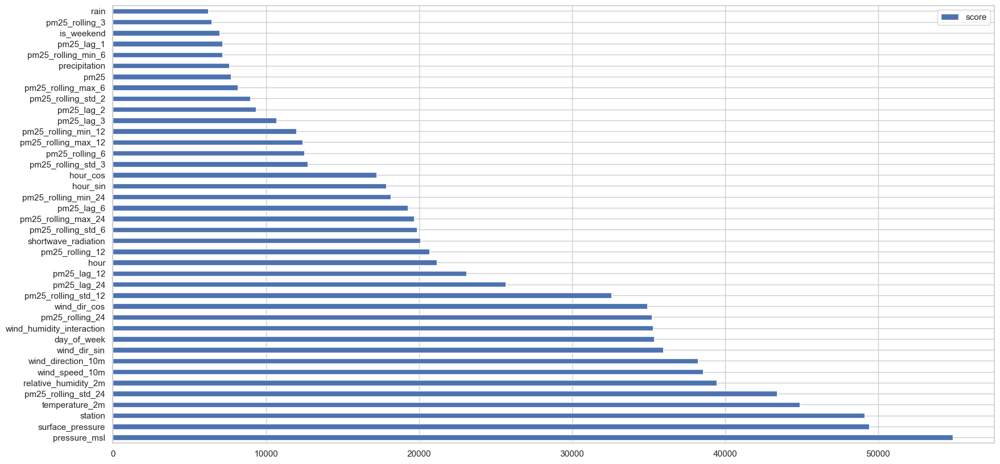

In [865]:
feature_important = xg_mid.get_booster().get_score(importance_type='weight')
keys = list(feature_important.keys())
values = list(feature_important.values())

data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
data.nlargest(40, columns="score").plot(kind='barh', figsize = (20,10)) ## plot top 40 features

<Axes: >

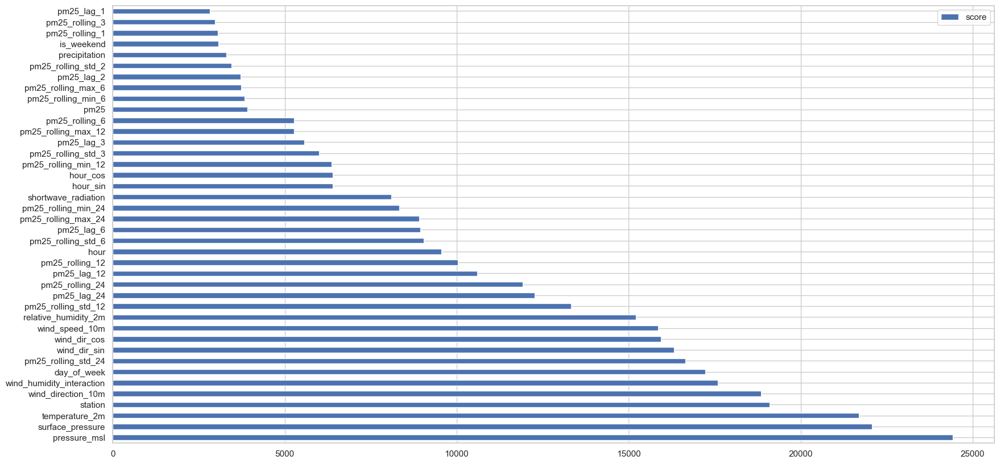

In [866]:
feature_important = xg_90.get_booster().get_score(importance_type='weight')
keys = list(feature_important.keys())
values = list(feature_important.values())

data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
data.nlargest(40, columns="score").plot(kind='barh', figsize = (20,10)) ## plot top 40 features

From observing the feature importance, we can see that the model is memorising the characteristics of each station, for example a station down south might have lower winds and be colder compared to a station that is up north so these subtle differences allow the model to predict. 
It can also be seen that surface pressure and pressure msl are the most important features, this was realised during our EDA, we could see that there was a positive relationship with PM2.5 and pressure. 

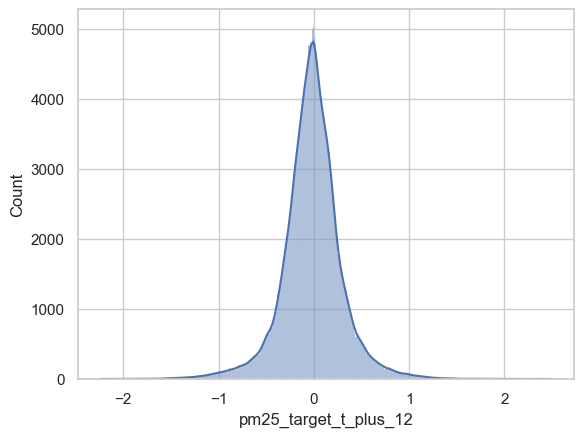

In [433]:
residuals = y_pm25_test - preds
sns.histplot(residuals, kde=True)
plt.show()

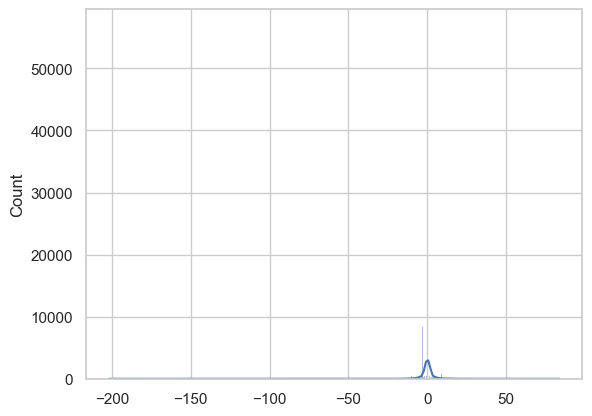

In [868]:
residuals = np.expm1(y_pm25_test) - np.expm1(X_pm25_test['pm25'])
sns.histplot(residuals, kde=True)
plt.show()

So from observing the residual graph here, we can see that persistance model tend to under predict t+12 a lot, this would make sense give that it's slow to react to change.

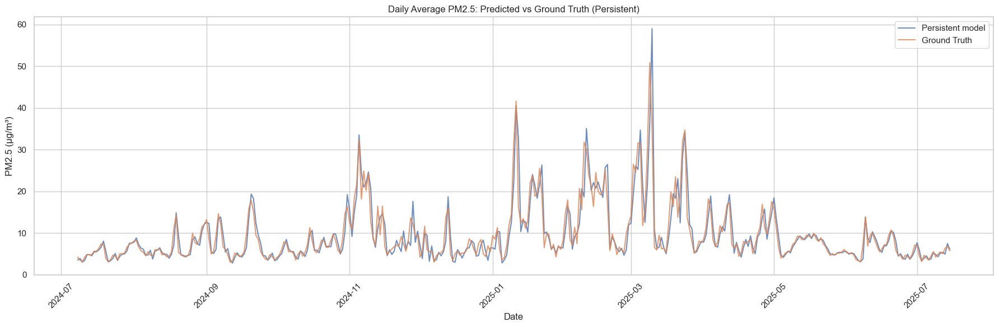

In [869]:

df_test = pd.DataFrame({
    "date": X_pm25_test.index,   # replace "date" with your actual datetime column name
    "pm25_predicted": np.expm1(X_pm25_test['pm25']),
    "pm25_ground": np.expm1(y_pm25_test),
})

# Convert to datetime if not already
df_test["date"] = pd.to_datetime(df_test["date"])

# Group by day and take the mean
daily_avg_pred = df_test.groupby(df_test["date"].dt.date)["pm25_predicted"].mean()
daily_avg_ground = df_test.groupby(df_test["date"].dt.date)["pm25_ground"].mean()

plt.figure(figsize=(18, 6))
plt.plot(daily_avg_pred.index, daily_avg_pred.values, label='Persistent model', alpha=0.8)
plt.plot(daily_avg_ground.index, daily_avg_ground.values, label='Ground Truth', alpha=0.8)
plt.xlabel('Date')
plt.ylabel('PM2.5 (µg/m³)')
plt.title('Daily Average PM2.5: Predicted vs Ground Truth (Persistent)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

From observing the graph above, it may look like the persistance model is doing a lot better than our trained model, however the graph doesn't tell you that the persistance model is always slow to react to changes in contrast to my model where it can quickly react to subtle changes given the meteorlgoical data. 

<div style="background: linear-gradient(90deg, #34495e 0%, #2c3e50 100%);
            height: 50px;
            border-radius: 8px;
            display: flex;
            align-items: center;
            padding-left: 20px;
            box-shadow: 0 1px 4px rgba(0,0,0,0.1);">
    <h3 style="margin: 0; 
               color: #ecf0f1; 
               font-size: 1.05em; 
               font-weight: 400;">
        1.1 Developing the Model to Predict o3
    </h3>
</div>

### Baseline model

In [884]:
# Define model and initialise TSS
n_splits = 5
tscv = TimeSeriesSplit(n_splits)
xg_reg_o3_base = xgb.XGBRegressor()

#Train model
validation_results = []
for fold, (train_idx, test_idx) in enumerate(tscv.split(X_o3_train)):
    print("Fold: {}".format(fold))
    print("TRAIN indices:", train_idx, "\n", "TEST indices:", test_idx)
    X_train, X_test = X_o3_train.iloc[train_idx], X_o3_train.iloc[test_idx]
    y_train, y_test = y_o3_train_log.iloc[train_idx], y_o3_train_log.iloc[test_idx]
    
    
    
    encoder = ce.TargetEncoder(cols=['station', 'day_of_week'], handle_unknown='return_nan', handle_missing='return_nan')
    X_train = encoder.fit_transform(X_train, y_train)
    X_test = encoder.transform(X_test)
    
    xg_reg_o3_base.fit(X_train, y_train,
               eval_set=[(X_test, y_test)],
               verbose=True)
    validation_results.append(xg_reg_o3_base.evals_result())



Fold: 0
TRAIN indices: [     0      1      2 ... 109345 109346 109347] 
 TEST indices: [109348 109349 109350 ... 218692 218693 218694]
[0]	validation_0-rmse:0.58959
[1]	validation_0-rmse:0.56613
[2]	validation_0-rmse:0.55319
[3]	validation_0-rmse:0.54379
[4]	validation_0-rmse:0.53620
[5]	validation_0-rmse:0.52892
[6]	validation_0-rmse:0.52527
[7]	validation_0-rmse:0.52572
[8]	validation_0-rmse:0.52635
[9]	validation_0-rmse:0.52465
[10]	validation_0-rmse:0.52427
[11]	validation_0-rmse:0.52530
[12]	validation_0-rmse:0.52355
[13]	validation_0-rmse:0.52358
[14]	validation_0-rmse:0.52498
[15]	validation_0-rmse:0.52505
[16]	validation_0-rmse:0.52558
[17]	validation_0-rmse:0.52600
[18]	validation_0-rmse:0.52662
[19]	validation_0-rmse:0.52611
[20]	validation_0-rmse:0.52768
[21]	validation_0-rmse:0.52641
[22]	validation_0-rmse:0.52714
[23]	validation_0-rmse:0.52696
[24]	validation_0-rmse:0.52703
[25]	validation_0-rmse:0.52740
[26]	validation_0-rmse:0.52772
[27]	validation_0-rmse:0.52771
[28]	va

In [973]:

encoder = ce.TargetEncoder(cols=['station', 'day_of_week'], handle_unknown='return_nan', handle_missing='return_nan')
encoder.fit_transform(X_o3_train, y_o3_train_log)
X_o3_test_encoded = encoder.transform(X_o3_test)
predicted = xg_reg_o3_base.predict(X_o3_test_encoded)
evaluate_model(np.expm1(y_o3_test), np.expm1(predicted), False)

MAE: 12.967782353712753 
 R2: 0.41187103362944066 
 MSE: 279.3193881576701 
 RMSE: 16.71285098831645


In [886]:
idx = np.where(y_o3_test > np.log1p(50))[0]
idx
RMSE = root_mean_squared_error(np.expm1(y_o3_test[idx]), predicted[idx])
print(f'RMSE for values above 100 o3: {RMSE}')


RMSE for values above 100 o3: 66.08189421275148


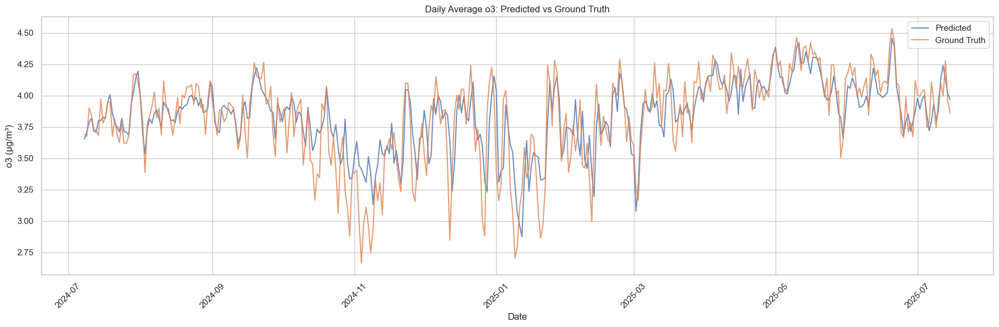

In [888]:
df_test = pd.DataFrame({
    "date": X_o3_test_encoded.index,   
    "o3_predicted": predicted,
    "o3_ground": y_o3_test,
})


df_test["date"] = pd.to_datetime(df_test["date"])


daily_avg_pred = df_test.groupby(df_test["date"].dt.date)["o3_predicted"].mean()
daily_avg_ground = df_test.groupby(df_test["date"].dt.date)["o3_ground"].mean()

plt.figure(figsize=(18, 6))
plt.plot(daily_avg_pred.index, daily_avg_pred.values, label='Predicted', alpha=0.8)
plt.plot(daily_avg_ground.index, daily_avg_ground.values, label='Ground Truth', alpha=0.8)
plt.xlabel('Date')
plt.ylabel('o3 (µg/m³)')
plt.title('Daily Average o3: Predicted vs Ground Truth')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Tuning

In [ ]:

n_splits = 5
tscv = TimeSeriesSplit(n_splits)
def objective_o3_base(trial, data=X_o3_train, target=y_o3_train_log):
    param = {
        "objective": "reg:squarederror",
        "tree_method": "gpu_hist",
        "predictor": "gpu_predictor",
        "random_state": 42,

        "alpha": trial.suggest_loguniform("alpha", 1e-8, 10.0),      # L1
        "lambda": trial.suggest_loguniform("lambda", 1e-8, 10.0),    # L2
        "colsample_bytree": trial.suggest_categorical("colsample_bytree", [0.5, 0.7, 0.9, 1.0]),
        "colsample_bylevel": trial.suggest_categorical("colsample_bylevel", [0.5, 0.7, 0.9, 1.0]),
        "subsample": trial.suggest_uniform("subsample", 0.5, 1.0),
        "learning_rate": trial.suggest_loguniform("learning_rate", 0.01, 0.3),
        "n_estimators": trial.suggest_int("n_estimators", 200, 2000),
        "max_depth": trial.suggest_int("max_depth", 3, 11),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 20),
    }
    rmse_list = []
    for fold, (train_idx, val_idx) in enumerate(tscv.split(data)):
        X_train = data.iloc[train_idx]
        y_train = target.iloc[train_idx]

        X_val = data.iloc[val_idx]
        y_val = target.iloc[val_idx]
        encoder = ce.TargetEncoder(cols=['station', 'day_of_week'], handle_unknown='return_nan', handle_missing='return_nan', smoothing=0.3)
        X_train = encoder.fit_transform(X_train, y_train)

        X_val = encoder.transform(X_val)
    
        model = xgb.XGBRegressor(**param)
        model.fit(X_train, y_train,
            eval_set=[(X_val, y_val)],
            verbose=False)
        predicted = model.predict(X_val)

        q_loss = mean_squared_error(y_val, predicted)
        rmse_list.append(q_loss)
    return np.mean(rmse_list)

In [1298]:
study = optuna.create_study(direction='minimize')
study.optimize(objective_o3_base, n_trials=150)
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)




[I 2025-09-25 09:52:28,199] A new study created in memory with name: no-name-f696a0fe-e1f5-496a-a2df-918766edf1c2
[I 2025-09-25 09:54:28,820] Trial 0 finished with value: 0.20051818368026475 and parameters: {'alpha': 0.0011216275971375497, 'lambda': 6.954615399639539e-06, 'colsample_bytree': 0.9, 'colsample_bylevel': 0.9, 'subsample': 0.7896591274587117, 'learning_rate': 0.1856539156217841, 'n_estimators': 1838, 'max_depth': 6, 'min_child_weight': 19}. Best is trial 0 with value: 0.20051818368026475.
[I 2025-09-25 09:56:58,503] Trial 1 finished with value: 0.17685613237039338 and parameters: {'alpha': 8.067211290616399e-06, 'lambda': 8.379735682713235e-05, 'colsample_bytree': 0.5, 'colsample_bylevel': 0.5, 'subsample': 0.9766005284081749, 'learning_rate': 0.046894623481992886, 'n_estimators': 1621, 'max_depth': 8, 'min_child_weight': 10}. Best is trial 1 with value: 0.17685613237039338.
[I 2025-09-25 09:59:50,980] Trial 2 finished with value: 0.17698842925799313 and parameters: {'alpha

Number of finished trials: 150
Best trial: {'alpha': 7.710698072758229e-07, 'lambda': 9.194704010639119e-08, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.7, 'subsample': 0.8794886547268324, 'learning_rate': 0.013507641559119175, 'n_estimators': 330, 'max_depth': 8, 'min_child_weight': 18}


In [109]:
# {'alpha': 2.202853215504914, 'quantile_alpha': 0.4889120732383227, 'lambda': 3.9181750801845334, 'colsample_bytree': 0.5, 'colsample_bylevel': 1.0, 'learning_rate': 0.010804581921426191, 'n_estimators': 1666, 'max_depth': 13, 'min_child_weight': 1}
#{'alpha': 6.976651032946712, 'quantile_alpha': 0.945417564822301, 'lambda': 2.7664232674303677, 'colsample_bytree': 0.5, 'colsample_bylevel': 0.7, 'subsample': 0.6478100805290188, 'learning_rate': 0.0037622453497417204, 'n_estimators': 1951, 'max_depth': 11, 'min_child_weight': 18}###
n_splits = 5
tscv = TimeSeriesSplit(n_splits)
xg_reg_o3_upper = xgb.XGBRegressor(
    objective='reg:quantileerror',
    quantile_alpha=0.63,
    reg_lambda= 2.7664,
    reg_alpha=6.976651,
    colsample_bytree=0.5,
    colsample_bylevel=0.7,
    subsample=0.6478,
    learning_rate=0.0037,
    n_estimators=1951,
    max_depth=11,
    min_child_weight=18,
    random_state=42,
    verbose=0,
    tree_method='gpu_hist',
    predictor='gpu_predictor'
)

#Train model

    
    
encoder = ce.TargetEncoder(cols=['station', 'day_of_week'], handle_unknown='return_nan', handle_missing='return_nan')
X_train = encoder.fit_transform(X_o3_train, y_o3_train_log)

xg_reg_o3_upper.fit(X_train, y_o3_train_log,
            verbose=True)


,objective,'reg:quantileerror'
,base_score,None
,booster,None
,callbacks,None
,colsample_bylevel,0.7
,colsample_bynode,None
,colsample_bytree,0.5
,device,None
,early_stopping_rounds,None
,enable_categorical,False
,eval_metric,None


In [408]:
# {'alpha': 7.710698072758229e-07, 'lambda': 9.194704010639119e-08, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.7, 'subsample': 0.8794886547268324, 'learning_rate': 0.013507641559119175, 'n_estimators': 330, 'max_depth': 8, 'min_child_weight': 18}
xg_reg_o3_lower = xgb.XGBRegressor(
    objective='reg:squarederror',
    reg_lambda= 9.194704010639119e-08,
    reg_alpha=7.710698072758229e-07,
    colsample_bytree=0.7,
    colsample_bylevel=0.7,
    subsample=0.8794,
    learning_rate=0.0135,
    n_estimators=330,
    max_depth=8,
    min_child_weight=18,
    random_state=42,
    verbose=0,
    tree_method='gpu_hist',
    predictor='gpu_predictor'
)

#Train model

    
    
encoder = ce.TargetEncoder(cols=['station', 'day_of_week'], handle_unknown='return_nan', handle_missing='return_nan')
X_train = encoder.fit_transform(X_o3_train, y_o3_train_log)

xg_reg_o3_lower.fit(X_train, y_o3_train_log,
            verbose=True)

,objective,'reg:squarederror'
,base_score,None
,booster,None
,callbacks,None
,colsample_bylevel,0.7
,colsample_bynode,None
,colsample_bytree,0.7
,device,None
,early_stopping_rounds,None
,enable_categorical,False
,eval_metric,None


In [403]:
xg_reg_o3_lower.save_model('xg_reg_o3.model')

In [ ]:
#{'lambda': 2.372844333429898, 'alpha': 0.09419725592464301, 'colsample_bytree': 0.5, 'colsample_bylevel': 0.9, 'subsample': 0.2974304744906926, 'learning_rate': 0.004826304873598336, 'n_estimators': 1089, 'max_depth': 10, 'min_child_weight': 15, 'scale_pos_weight': 1.0330806843913636, 'threshold': 0.4124654104591555}
n_splits = 5
threshold = np.log1p(60)
tscv = TimeSeriesSplit(n_splits)
binary_classifier = xgb.XGBClassifier(
    reg_lambda=2.372844333429898,  
    reg_alpha=0.09419725592464301,
    colsample_bytree=0.5,
    colsample_bylevel=0.9,
    subsample=0.2974304744906926,
    learning_rate=0.004826,
    n_estimators=1089,
    max_depth=10,
    min_child_weight=15,
    scale_pos_weight=1.0330,
    tree_method='gpu_hist',          
    predictor='gpu_predictor',        
    use_label_encoder=False,
    eval_metric='logloss'
)
f12 = []

binary_o3_test = (y_o3_train_log > threshold).astype(int)

encoder = ce.TargetEncoder(cols=['station', 'day_of_week'], handle_unknown='return_nan', handle_missing='return_nan', smoothing=0.3)
X_train = encoder.fit_transform(X_o3_train, binary_o3_test)

binary_classifier.fit(X_train, binary_o3_test)


# binary_classifier.save_model('binary_classifier.model')

,objective,'binary:logistic'
,base_score,None
,booster,None
,callbacks,None
,colsample_bylevel,0.9
,colsample_bynode,None
,colsample_bytree,0.5
,device,None
,early_stopping_rounds,None
,enable_categorical,False
,eval_metric,'logloss'


In [1134]:

#{'learning_rate': 0.041339276793970856, 'n_estimators': 688, 'max_depth': 8, 'min_child_weight': 3, 'gamma': 1.2237773035237614, 'subsample': 0.8456036230372825, 'colsample_bytree': 0.6557306933760569, 'colsample_bylevel': 0.9537285438856942, 'scale_pos_weight': 1.0154290444016436}
n_splits = 5
threshold = np.log1p(60)
tscv = TimeSeriesSplit(n_splits)
binary_classifier  = xgb.XGBClassifier(
    reg_lambda=0.14590064797090177,   # L2 regularization
    reg_alpha=0.015516376176959647,   # L1 regularization
    colsample_bytree=0.5,
    colsample_bylevel=0.7,
    subsample=0.9989080383397015,
    learning_rate=0.003652473075998669,
    n_estimators=1789,
    max_depth=12,
    min_child_weight=10,
    tree_method='gpu_hist',            # GPU training
    predictor='gpu_predictor',         # GPU prediction
    use_label_encoder=False,
    eval_metric='logloss'
)
f12 = []

binary_o3_test = (y_o3_train_log > threshold).astype(int)
for fold, (train_idx, test_idx) in enumerate(tscv.split(X_o3_train)):
    print("Fold: {}".format(fold))
    print("TRAIN indices:", train_idx, "\n", "TEST indices:", test_idx)
    X_train, X_test = X_o3_train.iloc[train_idx], X_o3_train.iloc[test_idx]
    y_train, y_test = binary_o3_test.iloc[train_idx], binary_o3_test.iloc[test_idx]
    
    encoder = ce.TargetEncoder(cols=['station', 'day_of_week'], handle_unknown='return_nan', handle_missing='return_nan')
    X_train = encoder.fit_transform(X_train, y_train)
    X_test = encoder.transform(X_test)
    
    binary_classifier.fit(X_train, y_train,
            eval_set=[(X_test, y_test)],
            verbose=0)
    predict_prob = binary_classifier.predict_proba(X_test)[:, 1]

    # For ROC-AUC
    fpr, tpr, thresholds = metrics.roc_curve(y_test, predict_prob, pos_label=1)
    auc = metrics.auc(fpr, tpr)

    # For F1-score (binary)
    k = np.arange(0.01, 1, 0.01)
    best = 0
    thres = 0
    for threshold in k:
        predict_label = (predict_prob > threshold).astype(int)
        f1 = metrics.f1_score(y_test, predict_label)
        if f1 > best:
            best = f1
            thres = threshold
    f12.append(thres)

# binary_classifier.save_model('binary_classifier.model')

Fold: 0
TRAIN indices: [     0      1      2 ... 109345 109346 109347] 
 TEST indices: [109348 109349 109350 ... 218692 218693 218694]
Fold: 1
TRAIN indices: [     0      1      2 ... 218692 218693 218694] 
 TEST indices: [218695 218696 218697 ... 328039 328040 328041]
Fold: 2
TRAIN indices: [     0      1      2 ... 328039 328040 328041] 
 TEST indices: [328042 328043 328044 ... 437386 437387 437388]
Fold: 3
TRAIN indices: [     0      1      2 ... 437386 437387 437388] 
 TEST indices: [437389 437390 437391 ... 546733 546734 546735]
Fold: 4
TRAIN indices: [     0      1      2 ... 546733 546734 546735] 
 TEST indices: [546736 546737 546738 ... 656080 656081 656082]


In [1198]:
n_splits = 5
threshold = np.log1p(60)
tscv = TimeSeriesSplit(n_splits)

binary_o3_test = (y_o3_train_log > threshold).astype(int)
def objective_o3_classifier(trial, data=X_o3_train, target=binary_o3_test):
    param = {
        'objective': 'binary:logistic',   # change to multi:softmax for multiclass
        'eval_metric': 'logloss',         # or 'error', 'auc', etc.
        'lambda': trial.suggest_loguniform('lambda', 0.1, 10),
        'alpha': trial.suggest_loguniform('alpha', 0.01, 10),
        'colsample_bytree': trial.suggest_categorical('colsample_bytree', [0.5, 0.7, 0.9, 1.0]),
        'colsample_bylevel': trial.suggest_categorical('colsample_bylevel', [0.5, 0.7, 0.9, 1.0]),
        'subsample': trial.suggest_float('subsample', 0.01, 1.0),
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.1, log=True),
        'n_estimators': trial.suggest_int('n_estimators', 100, 1200),
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 20),
        'random_state': 25,
        'tree_method': 'gpu_hist',
        'predictor': 'gpu_predictor',
        'scale_pos_weight': trial.suggest_float('scale_pos_weight', 0.1, 10, log=True),
        'threshold': trial.suggest_loguniform('threshold', 0.01, 0.99),
        'early_stopping_rounds': 50
        
    }
    f1_list = []
    for fold, (train_idx, val_idx) in enumerate(tscv.split(data)):
        X_train = data.iloc[train_idx]
        y_train = target.iloc[train_idx]

        X_val = data.iloc[val_idx]
        y_val = target.iloc[val_idx]
        encoder = ce.TargetEncoder(cols=['station', 'day_of_week'], handle_unknown='return_nan', handle_missing='return_nan', smoothing=0.3)
        encoder.fit(data.iloc[:train_idx.max()], target.iloc[:train_idx.max()])
        X_train = encoder.transform(X_train)  # Only transform, don't fit again
        X_val = encoder.transform(X_val)

        X_val = encoder.transform(X_val)
    
        model = xgb.XGBClassifier(**param)
        model.fit(X_train, y_train,
            eval_set=[(X_val, y_val)],
            verbose=False,
            )
        predict_prob = model.predict_proba(X_val)[:, 1]
        predict_label = (predict_prob > param['threshold']).astype(int)
        f1 = metrics.f1_score(y_val, predict_label)
        
        f1_list.append(f1)
    return np.mean(f1_list)

study = optuna.create_study(direction='maximize',
                            sampler=optuna.samplers.TPESampler(seed=42) )
study.optimize(objective_o3_classifier, n_trials=200)
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)

[I 2025-09-25 01:44:24,430] A new study created in memory with name: no-name-dd51db88-3116-45fd-aa32-9dbd94f95740


[I 2025-09-25 01:45:00,111] Trial 0 finished with value: 0.6119092077803812 and parameters: {'lambda': 0.5611516415334505, 'alpha': 7.114476009343421, 'colsample_bytree': 0.5, 'colsample_bylevel': 0.7, 'subsample': 0.03037864935284442, 'learning_rate': 0.08706020878304858, 'n_estimators': 1016, 'max_depth': 5, 'min_child_weight': 4, 'scale_pos_weight': 0.2327067708383781, 'threshold': 0.04047217345839592}. Best is trial 0 with value: 0.6119092077803812.
[I 2025-09-25 01:45:33,617] Trial 1 finished with value: 0.022035852008853753 and parameters: {'lambda': 1.1207606211860568, 'alpha': 0.19762189340280073, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.9, 'subsample': 0.5190920940294755, 'learning_rate': 0.015304852121831466, 'n_estimators': 151, 'max_depth': 9, 'min_child_weight': 4, 'scale_pos_weight': 0.1349283426801325, 'threshold': 0.7827613503689783}. Best is trial 0 with value: 0.6119092077803812.
[I 2025-09-25 01:46:22,418] Trial 2 finished with value: 0.08265141693925852 and p

Number of finished trials: 200
Best trial: {'lambda': 2.372844333429898, 'alpha': 0.09419725592464301, 'colsample_bytree': 0.5, 'colsample_bylevel': 0.9, 'subsample': 0.2974304744906926, 'learning_rate': 0.004826304873598336, 'n_estimators': 1089, 'max_depth': 10, 'min_child_weight': 15, 'scale_pos_weight': 1.0330806843913636, 'threshold': 0.4124654104591555}


In [434]:
import category_encoders as ce
import numpy as np

# --- TargetEncoder ---
encoder = ce.TargetEncoder(
    cols=['station', 'day_of_week'], 
    handle_unknown='return_nan', 
    handle_missing='return_nan',
    smoothing=0.3
)
X_train_encoded = encoder.fit_transform(X_o3_train, y_o3_train_log)  # log target
X_test_encoded = encoder.transform(X_o3_test)


# ---Binary---
threshold = 0.412 # you can change this to increase recall or precision
predict_prob = binary_classifier.predict_proba(X_test_encoded)[:, 1]
predict_label = (predict_prob > threshold)
final_pred = np.zeros(len(X_test_encoded))
final_pred[~predict_label] = xg_reg_o3_lower.predict(X_test_encoded.loc[~predict_label])
final_pred[predict_label] = xg_reg_o3_upper.predict(X_test_encoded.loc[predict_label])
preds = pd.DataFrame(final_pred, index=X_test_encoded.index, columns=['pm2.5_predicted'])['pm2.5_predicted']

evaluate_model(np.expm1(y_o3_test), np.expm1(preds), False)

ValueError: feature_names mismatch: ['station', 'pm25', 'wind_speed_10m', 'wind_direction_10m', 'temperature_2m', 'relative_humidity_2m', 'precipitation', 'rain', 'surface_pressure', 'pressure_msl', 'shortwave_radiation', 'is_holiday', 'day_of_week', 'hour', 'hour_sin', 'hour_cos', 'wind_humidity_interaction', 'wind_dir_sin', 'wind_dir_cos', 'is_weekend', 'pm25_lag_1', 'pm25_lag_2', 'pm25_lag_3', 'pm25_lag_6', 'pm25_lag_12', 'pm25_lag_24', 'pm25_rolling_1', 'pm25_rolling_2', 'pm25_rolling_3', 'pm25_rolling_6', 'pm25_rolling_12', 'pm25_rolling_24', 'pm25_rolling_std_1', 'pm25_rolling_std_2', 'pm25_rolling_std_3', 'pm25_rolling_std_6', 'pm25_rolling_std_12', 'pm25_rolling_std_24', 'pm25_rolling_min_1', 'pm25_rolling_min_2', 'pm25_rolling_min_3', 'pm25_rolling_min_6', 'pm25_rolling_min_12', 'pm25_rolling_min_24', 'pm25_rolling_max_1', 'pm25_rolling_max_2', 'pm25_rolling_max_3', 'pm25_rolling_max_6', 'pm25_rolling_max_12', 'pm25_rolling_max_24'] ['station', 'o3', 'wind_speed_10m', 'wind_direction_10m', 'temperature_2m', 'relative_humidity_2m', 'precipitation', 'rain', 'surface_pressure', 'pressure_msl', 'shortwave_radiation', 'is_holiday', 'day_of_week', 'hour', 'hour_sin', 'hour_cos', 'wind_humidity_interaction', 'wind_dir_sin', 'wind_dir_cos', 'is_weekend', 'o3_lag_1', 'o3_lag_2', 'o3_lag_3', 'o3_lag_6', 'o3_lag_12', 'o3_lag_24', 'o3_rolling_1', 'o3_rolling_2', 'o3_rolling_3', 'o3_rolling_6', 'o3_rolling_12', 'o3_rolling_24', 'o3_rolling_std_1', 'o3_rolling_std_2', 'o3_rolling_std_3', 'o3_rolling_std_6', 'o3_rolling_std_12', 'o3_rolling_std_24', 'o3_rolling_min_1', 'o3_rolling_min_2', 'o3_rolling_min_3', 'o3_rolling_min_6', 'o3_rolling_min_12', 'o3_rolling_min_24', 'o3_rolling_max_1', 'o3_rolling_max_2', 'o3_rolling_max_3', 'o3_rolling_max_6', 'o3_rolling_max_12', 'o3_rolling_max_24']
expected pm25_rolling_2, pm25_rolling_max_24, pm25_rolling_12, pm25_rolling_max_1, pm25_lag_2, pm25_rolling_min_2, pm25_rolling_max_3, pm25_rolling_min_24, pm25_rolling_std_3, pm25_lag_24, pm25_rolling_std_12, pm25_rolling_1, pm25, pm25_rolling_max_2, pm25_rolling_6, pm25_rolling_min_12, pm25_rolling_std_1, pm25_rolling_std_2, pm25_rolling_min_1, pm25_rolling_min_3, pm25_rolling_max_6, pm25_lag_12, pm25_rolling_max_12, pm25_rolling_std_6, pm25_lag_3, pm25_rolling_24, pm25_lag_6, pm25_rolling_3, pm25_rolling_min_6, pm25_rolling_std_24, pm25_lag_1 in input data
training data did not have the following fields: o3_rolling_max_1, o3_rolling_std_1, o3_rolling_1, o3_rolling_std_24, o3_rolling_std_12, o3_rolling_std_2, o3_rolling_min_1, o3_rolling_12, o3_rolling_max_24, o3_rolling_max_12, o3_rolling_min_3, o3_rolling_std_3, o3_rolling_3, o3_rolling_min_24, o3_rolling_max_3, o3, o3_rolling_max_6, o3_lag_2, o3_rolling_min_6, o3_rolling_max_2, o3_lag_1, o3_rolling_24, o3_lag_24, o3_rolling_min_2, o3_lag_12, o3_rolling_min_12, o3_lag_3, o3_lag_6, o3_rolling_2, o3_rolling_6, o3_rolling_std_6

In [411]:
encoder = ce.TargetEncoder(
    cols=['station', 'day_of_week'], 
    handle_unknown='return_nan', 
    handle_missing='return_nan',
    smoothing=0.3
)
X_train_encoded = encoder.fit_transform(X_o3_train, y_o3_train_log)  # log target
X_test_encoded = encoder.transform(X_o3_test)

preds = xg_reg_o3_lower.predict(X_test_encoded)
evaluate_model(np.expm1(y_o3_test), np.expm1(preds), False)

MAE: 12.492854483042585 
 R2: 0.45899942617111 
 MSE: 256.9367569282818 
 RMSE: 16.029246923304967


In [412]:
idx = np.where(y_o3_test > np.log1p(60))[0]
RMSE = root_mean_squared_error(np.expm1(y_o3_test[idx]), np.expm1(preds[idx]))
print(f'RMSE for values above 60 o3: {RMSE}')
idx = np.where(y_o3_test < np.log1p(60))[0]
RMSE = root_mean_squared_error(np.expm1(y_o3_test[idx]), np.expm1(preds[idx]))
print(f'RMSE for values below 60 o3: {RMSE}')

RMSE for values above 60 o3: 18.327750073514594
RMSE for values below 60 o3: 14.485335301535027


In [413]:
evaluate_model(np.expm1(y_o3_test), np.expm1(X_o3_test['o3']), False)
idx = np.where(y_o3_test < y_o3_train_log.quantile(0.99))[0]
RMSE = root_mean_squared_error(np.expm1(y_o3_test[idx]), np.expm1(np.expm1(X_o3_test['o3'])[idx]))
print(f'RMSE for values below 100 o3: {RMSE}')


MAE: 19.427740260303292 
 R2: -0.3724528914728962 
 MSE: 651.8174139375709 
 RMSE: 25.53071510822936
RMSE for values below 100 o3: 2.7954608987741216e+112


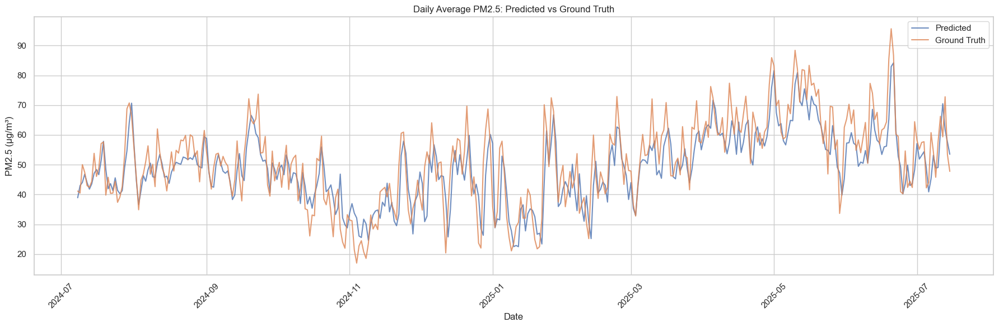

In [419]:
df_test = pd.DataFrame({
    "date": X_test_encoded.index,  
    "pm25_predicted": np.expm1(preds),
    "pm25_ground": np.expm1(y_o3_test),
})


df_test["date"] = pd.to_datetime(df_test["date"])

daily_avg_pred = df_test.groupby(df_test["date"].dt.date)["pm25_predicted"].mean()
daily_avg_ground = df_test.groupby(df_test["date"].dt.date)["pm25_ground"].mean()

plt.figure(figsize=(18, 6))
plt.plot(daily_avg_pred.index, daily_avg_pred.values, label='Predicted', alpha=0.8)
plt.plot(daily_avg_ground.index, daily_avg_ground.values, label='Ground Truth', alpha=0.8)
plt.xlabel('Date')
plt.ylabel('PM2.5 (µg/m³)')
plt.title('Daily Average PM2.5: Predicted vs Ground Truth')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

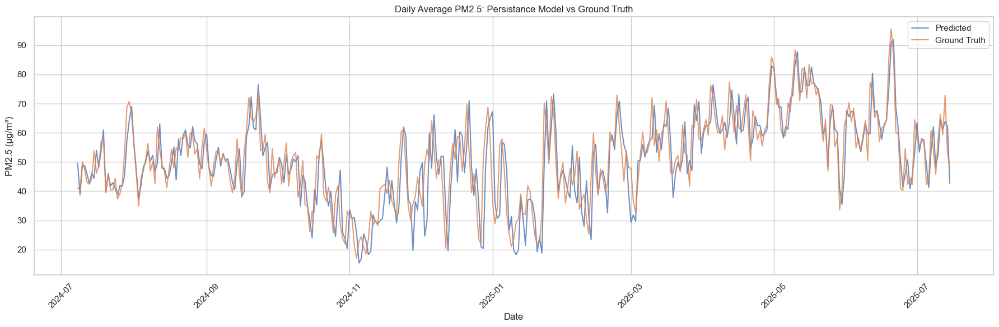

In [422]:
df_test = pd.DataFrame({
    "date": X_test_encoded.index,  
    "pm25_predicted": np.expm1(X_o3_test['o3']),
    "pm25_ground": np.expm1(y_o3_test),
})


df_test["date"] = pd.to_datetime(df_test["date"])

daily_avg_pred = df_test.groupby(df_test["date"].dt.date)["pm25_predicted"].mean()
daily_avg_ground = df_test.groupby(df_test["date"].dt.date)["pm25_ground"].mean()

plt.figure(figsize=(18, 6))
plt.plot(daily_avg_pred.index, daily_avg_pred.values, label='Predicted', alpha=0.8)
plt.plot(daily_avg_ground.index, daily_avg_ground.values, label='Ground Truth', alpha=0.8)
plt.xlabel('Date')
plt.ylabel('PM2.5 (µg/m³)')
plt.title('Daily Average PM2.5: Persistance Model vs Ground Truth')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

<Axes: >

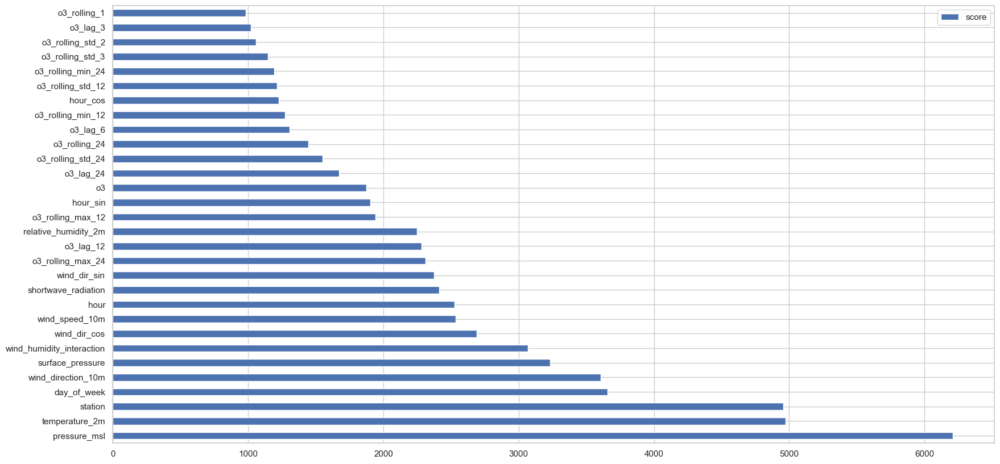

In [423]:
feature_important = xg_reg_o3_lower.get_booster().get_score(importance_type='weight')
keys = list(feature_important.keys())
values = list(feature_important.values())

data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
data.nlargest(30, columns="score").plot(kind='barh', figsize = (20,10)) ## plot top 40 features

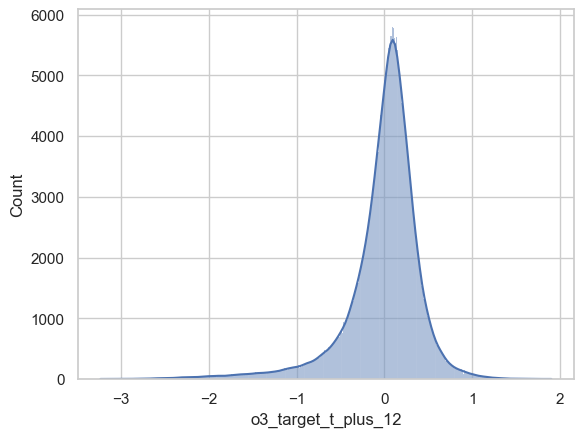

In [424]:
residuals = y_o3_test - preds
sns.histplot(residuals, kde=True)
plt.show()

The model seems to underpredict some values, this may be the case for peaks which is a common problem when using metorlogical data.